# Problem : Arm UNICEF Disaster Vulnerability Challenge
# Can you identify thatch-roofed houses for disaster planning in rural Malawi using aerial images?

# Model Used : RTMDET

![RTMDet](https://user-images.githubusercontent.com/27466624/225922103-404064c1-3cb0-4ab5-9388-79f9517dcdb0.jpg)


# General imports

In [44]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import re
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
from tqdm import tqdm
import seaborn as sns
import random

In [28]:
train = pd.read_csv("Train.csv")
test = pd.read_csv("Test.csv")

In [29]:
train.tail()

,image_id,bbox,category_id,id
26151,id_63zq72bgwrf0,"[303.0, 49.0, 58.0, 45.0]",2.0,1025.0
26152,id_a8ilmvtb8ucr,"[131.0, 36.0, 19.0, 22.0]",2.0,2406.0
26153,id_3f0dj2up0wak,"[293.0, 158.0, 47.0, 46.0]",2.0,1059.0
26154,id_l8998s0lnmzd,"[55.0, 43.0, 38.0, 55.0]",2.0,4220.0
26155,id_o34dx8g286le,"[0.0, 133.0, 31.0, 39.0]",2.0,2922.0


In [30]:
train['category_id'].unique()

array([ 2.,  3., nan,  1.])

In [32]:
train.info() #Total number of images = 26156
#with non null components 23849

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26156 entries, 0 to 26155
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   image_id     26156 non-null  object 
 1   bbox         23849 non-null  object 
 2   category_id  23849 non-null  float64
 3   id           23849 non-null  float64
dtypes: float64(2), object(2)
memory usage: 817.5+ KB


# Data cleaning

In [33]:
train.dropna(inplace=True)

In [34]:
train.info() #after dropping the null components

<class 'pandas.core.frame.DataFrame'>
Index: 23849 entries, 0 to 26155
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   image_id     23849 non-null  object 
 1   bbox         23849 non-null  object 
 2   category_id  23849 non-null  float64
 3   id           23849 non-null  float64
dtypes: float64(2), object(2)
memory usage: 931.6+ KB


In [35]:
train['category_id'].unique() #removed the images which was not having category

array([2., 3., 1.])

In [36]:
len(train['image_id'].unique())

2465

<Axes: xlabel='image_id', ylabel='count'>

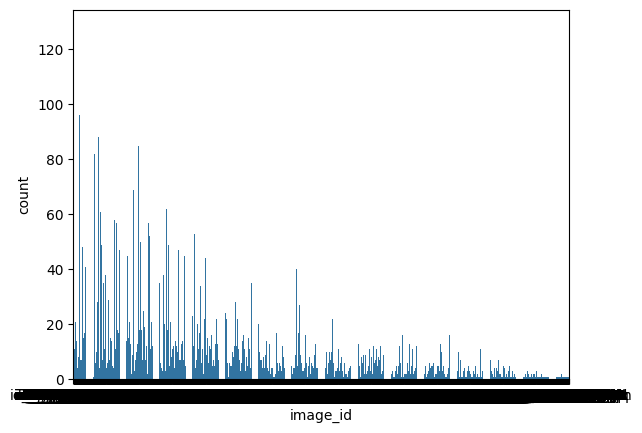

In [24]:
sns.countplot(x='image_id',data=train)

# Spliting the data

In [51]:
unique_images = train['image_id'].unique()
#shuffling the images
random.shuffle(unique_images)
len(unique_images)

2465

In [52]:
val_size = int(len(unique_images) * 0.2)
val_size

493

In [53]:
train_imgs = unique_images[:(len(unique_images) - val_size)]
val_imgs = unique_images[-val_size:]
train_imgs.shape, val_imgs.shape

((1972,), (493,))

In [54]:
train_imgs

array(['id_pm8k52j108ag', 'id_2hzlncrnu02k', 'id_gc2b0xkt1pa5', ...,
       'id_w96m5weoa10a', 'id_vyl0x2q49ujl', 'id_ex46y7u6qyq4'],
      dtype=object)

In [57]:
np.isin(train['image_id'].values, train_imgs).shape

(23849,)

In [58]:
train_idx = np.isin(train['image_id'].values, train_imgs)
val_idx = np.isin(train['image_id'].values, val_imgs)

train_idx.shape, val_idx.shape

((23849,), (23849,))

In [60]:
train_df = train.iloc[train_idx]
val_df = train.iloc[val_idx]

In [61]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 19513 entries, 0 to 26155
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   image_id     19513 non-null  object 
 1   bbox         19513 non-null  object 
 2   category_id  19513 non-null  float64
 3   id           19513 non-null  float64
dtypes: float64(2), object(2)
memory usage: 762.2+ KB


In [63]:
val_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4336 entries, 6 to 26154
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   image_id     4336 non-null   object 
 1   bbox         4336 non-null   object 
 2   category_id  4336 non-null   float64
 3   id           4336 non-null   float64
dtypes: float64(2), object(2)
memory usage: 169.4+ KB


# Visualize 

In [64]:
sample_img =  'id_8acxpv6j9fzs'

In [65]:
image_df = train_df[train_df['image_id'] == sample_img]

In [66]:
image_df.head()

,image_id,bbox,category_id,id
33,id_8acxpv6j9fzs,"[685.0, 950.0, 30.0, 23.0]",3.0,1400.0
699,id_8acxpv6j9fzs,"[750.0, 782.0, 32.0, 39.0]",3.0,1393.0
6153,id_8acxpv6j9fzs,"[788.0, 883.0, 24.0, 33.0]",3.0,1396.0
9729,id_8acxpv6j9fzs,"[622.0, 967.0, 17.0, 30.0]",3.0,1401.0
15143,id_8acxpv6j9fzs,"[866.0, 869.0, 23.0, 29.0]",3.0,1397.0


In [67]:
#The bbox column is a string, so we are going to decode the data points using regex
def decode_points(ddbox: str) -> list:
    points = [int(np.float32(point)) for point in re.findall(r'\d+\.\d+', ddbox)]
    return points

In [69]:
def plot_image_with_bbox(image_path, bboxes):
    img = Image.open(image_path)
    print(img.width , img.height)

    fig, ax = plt.subplots(1)

    ax.imshow(img)

    for bbox in bboxes:
        x, y, w, h = decode_points(bbox)
        rect = patches.Rectangle((x, y), w, h, linewidth=1, edgecolor='r', facecolor='none')
        ax.add_patch(rect)

    plt.axis('off')  # Turn off axis
    plt.show()

1000 1000


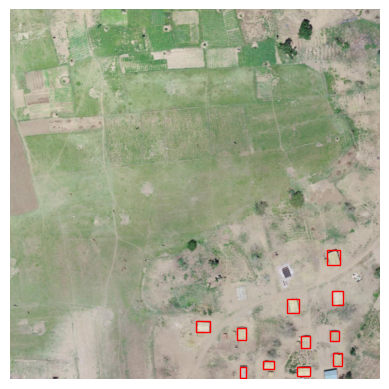

In [72]:
img_path = f"Images/{sample_img}.tif"
plot_image_with_bbox(img_path, image_df['bbox'].values)

# Coco format

In [73]:
import csv
import cv2
import os.path as osp
from collections import defaultdict
import json

def convert_csv_to_coco(data_frame,image_prefix,out_file):
    annotations = []
    images = []
    obj_count = 0
    
    # Dictionary to store annotations for each image
    image_annotations = defaultdict(list)
    
    for index, row in data_frame.iterrows():
        image_id = row['image_id']
        category_id = int(row['category_id'])
        bbox = eval(row['bbox'])  # Assuming bbox is stored as a string and can be evaluated to a list
        
        # Add annotation for the current image
        data_anno = {
            'id': obj_count,
            'category_id': category_id,
            'bbox': bbox,
            'area': bbox[2] * bbox[3],  # Calculate area based on width and height of bbox
            'segmentation': [bbox],  # Use bbox as segmentation
            'iscrowd': 0
        }
        image_annotations[image_id].append(data_anno)
        obj_count += 1
    
    # Process image annotations
    for idx, (image_id, annotations_list) in enumerate(image_annotations.items()):
    #   Here, you need to provide the actual path to the image prefix
        img_path = osp.join(image_prefix, f"{image_id}.tif")
        height,width,channel = cv2.imread(img_path).shape
        
        # Add image information
        images.append({
            'id': idx,
            'file_name': f"{image_id}.tif",
            'height': height,
            'width': width
        })
        
        # Add annotations for the current image
        for annotation in annotations_list:
            annotation['image_id'] = idx  # Update image_id to match the current image
            annotations.append(annotation)

    # Create COCO format JSON
    coco_format_json = {
        'images': images,
        'annotations': annotations,
        'categories': [
            {'id': 0, 'name': 'thatch'},  # Class 1
            {'id': 1, 'name': 'tin'},  # Class 2
            {'id': 2, 'name': 'others'},  # Class 3
        ]
    }
    
    # Save to output file
    with open(out_file, 'w') as outfile:
        json.dump(coco_format_json, outfile)


In [74]:
print(convert_csv_to_coco(train_df,'Images/','train.json'))

None


In [75]:
print(convert_csv_to_coco(val_df,'Images/','val.json'))

None


# Folder Creation

In [78]:
import shutil
import os

In [79]:
copy_from_folder = "Images"

In [80]:
#copy the images to their respective data folders
def create_data_folder(destination_folder, df):
    if not os.path.exists(destination_folder):
        os.makedirs(destination_folder)
        
    unique_images = df['image_id'].unique()
    
    for img in unique_images:
        img_path = os.path.join(copy_from_folder, img + '.tif')
        shutil.copy(img_path, destination_folder)

In [81]:
train_destination_folder = "train/"
val_destination_folder = "val/"

In [82]:
create_data_folder(train_destination_folder, train_df)
create_data_folder(val_destination_folder, val_df)

# Creating the labels for Yolo Model

In [ ]:
img_width = 500
img_height = 500

In [ ]:
def convert_bbox_to_string(bbox):
    box = decode_points(bbox)
    w = box[2]
    h = box[3]
    xc = box[0] + int(np.round(w/2))
    yc = box[1] + int(np.round(h/2))
    box = [xc/img_width, yc/img_height, w/img_width, h/img_height]
    box = [f"{i:.4g}" for i in box]
    return " ".join(box)

In [ ]:
def create_label_folder(label_dir, dataframe):
    if not os.path.exists(label_dir):
        os.makedirs(label_dir)
        
    unique_images = dataframe['image_id'].unique()
    
    for i,img in zip(tqdm(range(len(unique_images))), unique_images):
        df = dataframe[dataframe['image_id'] == img]
        output_lines = []
        for index, row in df.iterrows():
            category_id = int(row['category_id']) - 1

            bbox_string = convert_bbox_to_string(row['bbox'])
            output_lines.append(f'{category_id} {bbox_string}')

        with open(f"{label_dir}/{img}.txt", 'w') as f:
            for line in output_lines:
                f.write(line + '\n')

In [ ]:
create_label_folder("/kaggle/working/train/labels", train_df)
create_label_folder("/kaggle/working/val/labels", val_df)

# Download the pretrained weight

In [83]:
!mim download mmdet --config rtmdet_x_8xb32-300e_coco --dest ./checkpoints

processing rtmdet_x_8xb32-300e_coco...
rtmdet_x_8xb32-300e_coco_20220715_230555-cc79b9ae.pth exists in /home/user/mmdet/final/checkpoints
Successfully dumped rtmdet_x_8xb32-300e_coco.py to /home/user/mmdet/final/checkpoints


# Config File

In [104]:
config_balloon = """
# Inherit and overwrite part of the config based on this config
_base_ = './rtmdet_l_8xb32-300e_coco.py'

data_root = '/home/user/mmdet/final/data/' # dataset rootavailability of Deepcatch which will used in this project.  The UI activity can be developed without it. But considering past project experience with deepcatch for installing packages and checking the hardware for online availability will be challenging in this hardware, so if you provide it in the development stage it will be helpful.

train_batch_size_per_gpu = 4
train_num_workers = 2

max_epochs = 700
stage2_num_epochs = 1
base_lr = 0.00008


metainfo = {
    'classes': ('thatch','tin','others'),
    'palette': [
        (220, 20, 60),(225, 0, 0),(0, 0, 255)
    ]
}

train_dataloader = dict(
    batch_size=train_batch_size_per_gpu,
    num_workers=train_num_workers,
    dataset=dict(
        data_root=data_root,
        metainfo=metainfo,
        data_prefix=dict(img='train/'),
        ann_file='train.json'))

val_dataloader = dict(
    dataset=dict(
        data_root=data_root,
        metainfo=metainfo,
        data_prefix=dict(img='val/'),
        ann_file='val.json'))

test_dataloader = val_dataloader

val_evaluator = dict(ann_file=data_root + 'val.json')

test_evaluator = val_evaluator

model = dict(bbox_head=dict(num_classes=3))  #number of classes parameter

# learning rate
param_scheduler = [
    dict(
        type='LinearLR',
        start_factor=1.0e-5,
        by_epoch=False,
        begin=0,
        end=10),
    dict(
        # use cosine lr from 10 to 20 epoch
        type='CosineAnnealingLR',
        eta_min=base_lr * 0.05,
        begin=max_epochs // 2,
        end=max_epochs,
        T_max=max_epochs // 2,
        by_epoch=True,
        convert_to_iter_based=True),
]

train_pipeline_stage2 = [
    dict(type='LoadImageFromFile', backend_args=None),
    dict(type='LoadAnnotations', with_bbox=True),
    dict(
        type='RandomResize',
        scale=(640, 640),
        ratio_range=(0.1, 2.0),
        keep_ratio=True),
    dict(type='RandomCrop', crop_size=(640, 640)),
    dict(type='YOLOXHSVRandomAug'),
    dict(type='RandomFlip', prob=0.5),
    dict(type='Pad', size=(640, 640), pad_val=dict(img=(114, 114, 114))),
    dict(type='PackDetInputs')
]

# optimizer
optim_wrapper = dict(
    _delete_=True,
    type='OptimWrapper',
    optimizer=dict(type='AdamW', lr=base_lr, weight_decay=0.05),
    paramwise_cfg=dict(
        norm_decay_mult=0, bias_decay_mult=0, bypass_duplicate=True))

default_hooks = dict(
    checkpoint=dict(
        interval=5,
        max_keep_ckpts=2,  # only keep latest 2 checkpoints
        save_best='auto'
    ),
    logger=dict(type='LoggerHook', interval=5))

custom_hooks = [
    dict(
        type='PipelineSwitchHook',
        switch_epoch=max_epochs - stage2_num_epochs,
        switch_pipeline=train_pipeline_stage2)
]

# load COCO pre-trained weight
load_from = '/home/user/mmdet/final/checkpoints/rtmdet_x_8xb32-300e_coco_20220715_230555-cc79b9ae.pth'

train_cfg = dict(type='EpochBasedTrainLoop', max_epochs=max_epochs, val_interval=1)
visualizer = dict(vis_backends=[dict(type='LocalVisBackend'),dict(type='TensorboardVisBackend')])
"""

with open('/home/user/mmdet/final/mmdetection/configs/rtmdet/rtmdet_x_8xb32-300e_zind.py', 'w') as f:
    f.write(config_balloon)

# Train the Model

In [100]:
pwd

'/home/user/mmdet/final'

In [105]:
!python3 /home/user/mmdet/final/mmdetection/tools/train.py /home/user/mmdet/final/mmdetection/configs/rtmdet/rtmdet_x_8xb32-300e_zind.py

04/05 12:00:25 - mmengine - INFO - 
------------------------------------------------------------
System environment:
    sys.platform: linux
    Python: 3.8.10 (default, Nov 22 2023, 10:22:35) [GCC 9.4.0]
    CUDA available: True
    MUSA available: False
    numpy_random_seed: 644804304
    GPU 0: NVIDIA GeForce RTX 4080
    CUDA_HOME: /usr
    NVCC: Cuda compilation tools, release 10.1, V10.1.24
    GCC: x86_64-linux-gnu-gcc (Ubuntu 9.4.0-1ubuntu1~20.04.2) 9.4.0
    PyTorch: 2.1.2+cu121
    PyTorch compiling details: PyTorch built with:
  - GCC 9.3
  - C++ Version: 201703
  - Intel(R) oneAPI Math Kernel Library Version 2022.2-Product Build 20220804 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v3.1.1 (Git Hash 64f6bcbcbab628e96f33a62c3e975f8535a7bde4)
  - OpenMP 201511 (a.k.a. OpenMP 4.5)
  - LAPACK is enabled (usually provided by MKL)
  - NNPACK is enabled
  - CPU capability usage: AVX2
  - CUDA Runtime 12.1
  - NVCC architecture flags: -gencode;arch=compute_50,code

# Testing the trained detector

In [106]:
from mmdet.apis import DetInferencer
import glob

# Choose to use a config
config = 'mmdetection/configs/rtmdet/rtmdet_x_8xb32-300e_zind.py'
# Setup a checkpoint file to load
checkpoint = glob.glob('./work_dirs/rtmdet_x_8xb32-300e_zind/best_coco*.pth')[0]

# Set the device to be used for evaluation
device = 'cuda:0'

# Initialize the DetInferencer
inferencer = DetInferencer(config, checkpoint, device)

# Use the detector to do inference
img = 'data/train/id_0bw1v0z8nuy3.tif'
result = inferencer(img, out_dir='./output')

Loads checkpoint by local backend from path: ./work_dirs/rtmdet_x_8xb32-300e_zind/best_coco_bbox_mAP_epoch_272.pth


/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:196: UserWarning: Failed to add <class 'mmengine.visualization.vis_backend.LocalVisBackend'>, please provide the `save_dir` argument.
  warnings.warn(f'Failed to add {vis_backend.__class__}, '
/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:196: UserWarning: Failed to add <class 'mmengine.visualization.vis_backend.TensorboardVisBackend'>, please provide the `save_dir` argument.
  warnings.warn(f'Failed to add {vis_backend.__class__}, '


In [107]:

def get_classes_count(result):
    count_classes = {}
    count = 0
    classes = ((result['predictions'][0]['labels']))
    scores = ((result['predictions'][0]['scores']))
    count_classes[0] = 0
    count_classes[1] = 0
    count_classes[2] = 0

    for cls,score in zip(classes,scores):
        if score >=0.5:
            count_classes[cls] = count_classes.get(cls,0)+1
            count+=1

    return count_classes



# Testing the inference 


In [108]:
submission_df = pd.DataFrame(columns=["image_id", "Target"])

In [109]:
test = pd.read_csv("Test.csv")


In [110]:
for index, row in tqdm(test.iterrows(), total=len(test)):
    # pred = model.predict(f"/kaggle/input/arm-unicef-disaster-vulnerability-challenge/Images/{row['image_id']}.tif")
    result = inferencer(f"Images/{row['image_id']}.tif", out_dir='./output')
    pred_count = get_classes_count(result)
    
    df = pd.DataFrame({"image_id" : [f"{row['image_id']}_1",
                                     f"{row['image_id']}_2",
                                     f"{row['image_id']}_3"],
                      "Target" : [pred_count[0], pred_count[1], pred_count[2]]},columns=["image_id", "Target"])
    submission_df = pd.concat([submission_df, df], axis = 0)

  0%|          | 0/2045 [00:00<?, ?it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

  0%|          | 2/2045 [00:00<02:55, 11.62it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  0%|          | 4/2045 [00:00<02:46, 12.28it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  0%|          | 6/2045 [00:00<03:07, 10.88it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  0%|          | 8/2045 [00:00<02:53, 11.73it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  0%|          | 10/2045 [00:00<02:43, 12.41it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  1%|          | 12/2045 [00:01<03:00, 11.25it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  1%|          | 14/2045 [00:01<02:49, 11.97it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  1%|          | 16/2045 [00:01<02:38, 12.81it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  1%|          | 18/2045 [00:01<02:50, 11.91it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  1%|          | 20/2045 [00:01<03:04, 11.00it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  1%|          | 22/2045 [00:01<02:52, 11.73it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  1%|          | 24/2045 [00:01<02:35, 13.03it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

  1%|▏         | 26/2045 [00:02<02:45, 12.20it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  1%|▏         | 28/2045 [00:02<02:36, 12.91it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  1%|▏         | 30/2045 [00:02<02:39, 12.63it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  2%|▏         | 32/2045 [00:02<02:51, 11.76it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  2%|▏         | 34/2045 [00:02<02:47, 12.03it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  2%|▏         | 36/2045 [00:03<02:55, 11.42it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

  2%|▏         | 38/2045 [00:03<03:07, 10.69it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  2%|▏         | 40/2045 [00:03<03:00, 11.12it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  2%|▏         | 43/2045 [00:03<02:37, 12.68it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  2%|▏         | 45/2045 [00:03<02:38, 12.63it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

  2%|▏         | 47/2045 [00:03<02:56, 11.30it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  2%|▏         | 49/2045 [00:04<02:49, 11.80it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  2%|▏         | 51/2045 [00:04<02:46, 11.98it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  3%|▎         | 53/2045 [00:04<02:53, 11.45it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  3%|▎         | 55/2045 [00:04<03:08, 10.58it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  3%|▎         | 57/2045 [00:04<03:18, 10.03it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  3%|▎         | 59/2045 [00:05<03:09, 10.50it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  3%|▎         | 61/2045 [00:05<03:11, 10.38it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  3%|▎         | 63/2045 [00:05<03:09, 10.44it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  3%|▎         | 65/2045 [00:05<02:52, 11.48it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  3%|▎         | 67/2045 [00:05<02:40, 12.32it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  3%|▎         | 69/2045 [00:06<04:08,  7.96it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  3%|▎         | 71/2045 [00:06<03:43,  8.84it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  4%|▎         | 73/2045 [00:06<03:17,  9.97it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  4%|▎         | 75/2045 [00:06<02:59, 10.98it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  4%|▍         | 77/2045 [00:06<02:54, 11.27it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  4%|▍         | 79/2045 [00:07<03:00, 10.91it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

  4%|▍         | 81/2045 [00:07<03:11, 10.25it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  4%|▍         | 83/2045 [00:07<02:58, 11.00it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  4%|▍         | 85/2045 [00:07<02:47, 11.73it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  4%|▍         | 87/2045 [00:07<02:53, 11.28it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  4%|▍         | 89/2045 [00:07<02:56, 11.06it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  4%|▍         | 92/2045 [00:08<02:33, 12.70it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  5%|▍         | 94/2045 [00:08<02:45, 11.79it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  5%|▍         | 96/2045 [00:08<02:29, 13.01it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  5%|▍         | 98/2045 [00:08<02:46, 11.66it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  5%|▍         | 100/2045 [00:08<02:26, 13.24it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  5%|▍         | 102/2045 [00:08<02:45, 11.77it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  5%|▌         | 104/2045 [00:09<02:39, 12.14it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  5%|▌         | 106/2045 [00:09<02:53, 11.18it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  5%|▌         | 108/2045 [00:09<02:43, 11.87it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  5%|▌         | 110/2045 [00:09<02:54, 11.08it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  5%|▌         | 112/2045 [00:09<02:58, 10.81it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  6%|▌         | 114/2045 [00:10<02:46, 11.61it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

  6%|▌         | 116/2045 [00:10<02:57, 10.87it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  6%|▌         | 118/2045 [00:10<02:53, 11.08it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  6%|▌         | 120/2045 [00:10<02:42, 11.84it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

  6%|▌         | 122/2045 [00:10<03:08, 10.18it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  6%|▌         | 124/2045 [00:11<03:13,  9.91it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  6%|▌         | 126/2045 [00:11<03:14,  9.84it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  6%|▋         | 128/2045 [00:11<03:12,  9.94it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  6%|▋         | 130/2045 [00:11<02:59, 10.67it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  6%|▋         | 132/2045 [00:11<02:59, 10.68it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  7%|▋         | 134/2045 [00:11<03:00, 10.58it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

  7%|▋         | 136/2045 [00:12<03:07, 10.17it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  7%|▋         | 138/2045 [00:12<03:04, 10.32it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  7%|▋         | 140/2045 [00:12<03:08, 10.10it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  7%|▋         | 142/2045 [00:12<03:05, 10.26it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  7%|▋         | 144/2045 [00:12<02:59, 10.60it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  7%|▋         | 146/2045 [00:13<02:58, 10.64it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

  7%|▋         | 148/2045 [00:13<02:53, 10.93it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  7%|▋         | 150/2045 [00:13<02:56, 10.71it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  7%|▋         | 152/2045 [00:13<02:48, 11.24it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  8%|▊         | 154/2045 [00:13<02:51, 11.01it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

  8%|▊         | 156/2045 [00:14<03:02, 10.37it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  8%|▊         | 158/2045 [00:14<02:49, 11.11it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  8%|▊         | 160/2045 [00:14<02:27, 12.78it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  8%|▊         | 162/2045 [00:14<02:28, 12.68it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

  8%|▊         | 164/2045 [00:14<02:34, 12.14it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  8%|▊         | 166/2045 [00:14<02:46, 11.28it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  8%|▊         | 168/2045 [00:14<02:28, 12.68it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  8%|▊         | 170/2045 [00:15<02:29, 12.54it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  8%|▊         | 172/2045 [00:15<02:44, 11.37it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  9%|▊         | 174/2045 [00:15<02:29, 12.53it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  9%|▊         | 176/2045 [00:15<02:16, 13.65it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  9%|▊         | 178/2045 [00:15<02:28, 12.60it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  9%|▉         | 180/2045 [00:15<02:18, 13.47it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  9%|▉         | 182/2045 [00:16<02:32, 12.21it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  9%|▉         | 184/2045 [00:16<02:41, 11.56it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  9%|▉         | 186/2045 [00:16<02:55, 10.61it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  9%|▉         | 188/2045 [00:16<02:40, 11.57it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  9%|▉         | 190/2045 [00:16<02:36, 11.83it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  9%|▉         | 192/2045 [00:17<02:49, 10.91it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

  9%|▉         | 194/2045 [00:17<02:44, 11.23it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 10%|▉         | 196/2045 [00:17<02:41, 11.47it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 10%|▉         | 198/2045 [00:17<03:11,  9.65it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 10%|▉         | 200/2045 [00:17<02:54, 10.58it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 10%|▉         | 202/2045 [00:18<03:08,  9.78it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 10%|▉         | 204/2045 [00:18<02:41, 11.43it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 10%|█         | 206/2045 [00:18<02:22, 12.88it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 10%|█         | 208/2045 [00:18<02:40, 11.48it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 10%|█         | 210/2045 [00:18<02:52, 10.65it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 10%|█         | 212/2045 [00:18<03:01, 10.11it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 10%|█         | 214/2045 [00:19<02:55, 10.44it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 11%|█         | 216/2045 [00:19<03:13,  9.46it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 11%|█         | 218/2045 [00:19<03:05,  9.83it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 11%|█         | 220/2045 [00:19<03:09,  9.63it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 11%|█         | 222/2045 [00:19<03:08,  9.70it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 11%|█         | 224/2045 [00:20<02:57, 10.24it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 11%|█         | 226/2045 [00:20<02:47, 10.85it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 11%|█         | 228/2045 [00:20<02:50, 10.63it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 11%|█         | 230/2045 [00:20<02:44, 11.02it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 11%|█▏        | 232/2045 [00:20<02:22, 12.70it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 11%|█▏        | 234/2045 [00:20<02:36, 11.55it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 12%|█▏        | 236/2045 [00:21<02:43, 11.06it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 12%|█▏        | 238/2045 [00:21<02:33, 11.75it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 12%|█▏        | 240/2045 [00:21<02:25, 12.40it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 12%|█▏        | 242/2045 [00:21<02:10, 13.81it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 12%|█▏        | 244/2045 [00:21<02:19, 12.92it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 12%|█▏        | 246/2045 [00:21<02:36, 11.49it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 12%|█▏        | 248/2045 [00:22<02:34, 11.60it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 12%|█▏        | 250/2045 [00:22<02:53, 10.37it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 12%|█▏        | 252/2045 [00:22<02:41, 11.08it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 12%|█▏        | 254/2045 [00:22<02:39, 11.24it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 13%|█▎        | 256/2045 [00:22<02:47, 10.68it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 13%|█▎        | 258/2045 [00:23<02:51, 10.40it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 13%|█▎        | 260/2045 [00:23<03:04,  9.69it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 13%|█▎        | 262/2045 [00:23<02:38, 11.25it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 13%|█▎        | 264/2045 [00:23<02:43, 10.92it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 13%|█▎        | 266/2045 [00:23<02:23, 12.41it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 13%|█▎        | 268/2045 [00:23<02:39, 11.15it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 13%|█▎        | 270/2045 [00:24<02:45, 10.72it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 13%|█▎        | 272/2045 [00:24<02:41, 10.95it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 13%|█▎        | 274/2045 [00:24<02:40, 11.03it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 13%|█▎        | 276/2045 [00:24<02:40, 10.99it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 14%|█▎        | 278/2045 [00:24<02:37, 11.19it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 14%|█▎        | 280/2045 [00:25<02:45, 10.64it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 14%|█▍        | 283/2045 [00:25<02:27, 11.93it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 14%|█▍        | 285/2045 [00:25<02:31, 11.61it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 14%|█▍        | 287/2045 [00:25<02:42, 10.85it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 14%|█▍        | 289/2045 [00:25<02:42, 10.80it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 14%|█▍        | 291/2045 [00:26<02:46, 10.54it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 14%|█▍        | 293/2045 [00:26<02:46, 10.49it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 14%|█▍        | 295/2045 [00:26<02:27, 11.90it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 15%|█▍        | 297/2045 [00:26<02:24, 12.09it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 15%|█▍        | 299/2045 [00:26<02:39, 10.91it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 15%|█▍        | 301/2045 [00:26<02:35, 11.24it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 15%|█▍        | 303/2045 [00:27<02:51, 10.13it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 15%|█▍        | 305/2045 [00:27<02:53, 10.02it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 15%|█▌        | 307/2045 [00:27<02:47, 10.38it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 15%|█▌        | 309/2045 [00:27<02:55,  9.89it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 15%|█▌        | 311/2045 [00:27<02:50, 10.14it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 15%|█▌        | 313/2045 [00:28<02:49, 10.24it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 15%|█▌        | 315/2045 [00:28<02:29, 11.60it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 16%|█▌        | 317/2045 [00:28<02:35, 11.09it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 16%|█▌        | 319/2045 [00:28<02:28, 11.65it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 16%|█▌        | 321/2045 [00:28<02:33, 11.25it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 16%|█▌        | 323/2045 [00:28<02:28, 11.57it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 16%|█▌        | 325/2045 [00:29<02:43, 10.51it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 16%|█▌        | 327/2045 [00:29<02:21, 12.12it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 16%|█▌        | 329/2045 [00:29<02:13, 12.87it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 16%|█▌        | 331/2045 [00:29<02:31, 11.31it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 16%|█▋        | 333/2045 [00:29<02:40, 10.66it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 16%|█▋        | 335/2045 [00:30<02:37, 10.83it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 16%|█▋        | 337/2045 [00:30<02:37, 10.84it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 17%|█▋        | 339/2045 [00:30<02:48, 10.14it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 17%|█▋        | 341/2045 [00:30<02:53,  9.80it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 17%|█▋        | 343/2045 [00:30<02:46, 10.24it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 17%|█▋        | 345/2045 [00:30<02:28, 11.42it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 17%|█▋        | 347/2045 [00:31<02:27, 11.52it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 17%|█▋        | 349/2045 [00:31<02:15, 12.54it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 17%|█▋        | 351/2045 [00:31<02:09, 13.06it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 17%|█▋        | 353/2045 [00:31<02:25, 11.59it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 17%|█▋        | 355/2045 [00:31<02:35, 10.86it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 17%|█▋        | 357/2045 [00:32<02:34, 10.90it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 18%|█▊        | 359/2045 [00:32<02:27, 11.45it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 18%|█▊        | 361/2045 [00:32<02:31, 11.11it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 18%|█▊        | 363/2045 [00:32<02:33, 10.98it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 18%|█▊        | 365/2045 [00:32<02:16, 12.31it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 18%|█▊        | 367/2045 [00:32<02:32, 11.00it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 18%|█▊        | 369/2045 [00:33<02:17, 12.16it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 18%|█▊        | 371/2045 [00:33<02:11, 12.71it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 18%|█▊        | 373/2045 [00:33<02:17, 12.14it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 18%|█▊        | 375/2045 [00:33<02:39, 10.44it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 18%|█▊        | 377/2045 [00:33<02:34, 10.78it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 19%|█▊        | 379/2045 [00:33<02:41, 10.30it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 19%|█▊        | 381/2045 [00:34<02:28, 11.22it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 19%|█▊        | 383/2045 [00:34<02:32, 10.90it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 19%|█▉        | 385/2045 [00:34<02:43, 10.15it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 19%|█▉        | 387/2045 [00:34<02:48,  9.85it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 19%|█▉        | 389/2045 [00:34<02:44, 10.09it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 19%|█▉        | 391/2045 [00:35<02:39, 10.36it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 19%|█▉        | 393/2045 [00:35<02:18, 11.91it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 19%|█▉        | 395/2045 [00:35<02:19, 11.81it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 19%|█▉        | 397/2045 [00:35<02:32, 10.78it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 20%|█▉        | 399/2045 [00:35<02:35, 10.57it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 20%|█▉        | 401/2045 [00:36<02:30, 10.93it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 20%|█▉        | 403/2045 [00:36<02:25, 11.25it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 20%|█▉        | 405/2045 [00:36<02:24, 11.39it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 20%|█▉        | 407/2045 [00:36<02:24, 11.35it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 20%|██        | 409/2045 [00:36<02:22, 11.50it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 20%|██        | 411/2045 [00:36<02:16, 11.94it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 20%|██        | 413/2045 [00:37<02:17, 11.86it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 20%|██        | 415/2045 [00:37<02:31, 10.73it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 20%|██        | 417/2045 [00:37<02:36, 10.39it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 20%|██        | 419/2045 [00:37<02:26, 11.10it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 21%|██        | 421/2045 [00:37<02:17, 11.77it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 21%|██        | 423/2045 [00:37<02:03, 13.10it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 21%|██        | 425/2045 [00:38<02:04, 13.03it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 21%|██        | 427/2045 [00:38<02:23, 11.30it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 21%|██        | 429/2045 [00:38<02:15, 11.96it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 21%|██        | 431/2045 [00:38<02:10, 12.40it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 21%|██        | 433/2045 [00:38<02:16, 11.78it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 21%|██▏       | 435/2045 [00:38<02:16, 11.83it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 21%|██▏       | 437/2045 [00:39<02:05, 12.83it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 21%|██▏       | 439/2045 [00:39<02:03, 13.05it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 22%|██▏       | 441/2045 [00:39<02:08, 12.44it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 22%|██▏       | 443/2045 [00:39<02:21, 11.31it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 22%|██▏       | 445/2045 [00:39<02:32, 10.50it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 22%|██▏       | 447/2045 [00:40<02:43,  9.75it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 22%|██▏       | 449/2045 [00:40<02:37, 10.16it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 22%|██▏       | 451/2045 [00:40<02:39, 10.02it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 22%|██▏       | 453/2045 [00:40<02:36, 10.17it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 22%|██▏       | 455/2045 [00:41<03:37,  7.31it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 22%|██▏       | 456/2045 [00:41<03:31,  7.52it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 22%|██▏       | 457/2045 [00:41<03:22,  7.84it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 22%|██▏       | 459/2045 [00:41<02:57,  8.92it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 23%|██▎       | 461/2045 [00:41<02:39,  9.90it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 23%|██▎       | 463/2045 [00:41<02:47,  9.47it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 23%|██▎       | 465/2045 [00:41<02:25, 10.86it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 23%|██▎       | 467/2045 [00:42<02:14, 11.74it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 23%|██▎       | 469/2045 [00:42<02:19, 11.27it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 23%|██▎       | 471/2045 [00:42<02:36, 10.04it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 23%|██▎       | 473/2045 [00:42<02:34, 10.17it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 23%|██▎       | 475/2045 [00:42<02:29, 10.51it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 23%|██▎       | 477/2045 [00:43<02:20, 11.16it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 23%|██▎       | 479/2045 [00:43<02:17, 11.42it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 24%|██▎       | 481/2045 [00:43<02:22, 11.00it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 24%|██▎       | 483/2045 [00:43<02:21, 11.07it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 24%|██▎       | 485/2045 [00:43<02:29, 10.42it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 24%|██▍       | 487/2045 [00:44<02:35, 10.03it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 24%|██▍       | 489/2045 [00:44<02:20, 11.07it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 24%|██▍       | 491/2045 [00:44<02:24, 10.77it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 24%|██▍       | 493/2045 [00:44<02:31, 10.22it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 24%|██▍       | 495/2045 [00:44<02:32, 10.16it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 24%|██▍       | 497/2045 [00:44<02:24, 10.73it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 24%|██▍       | 499/2045 [00:45<02:29, 10.31it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 24%|██▍       | 501/2045 [00:45<02:32, 10.10it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 25%|██▍       | 503/2045 [00:45<02:20, 11.01it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 25%|██▍       | 505/2045 [00:45<02:22, 10.79it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 25%|██▍       | 507/2045 [00:45<02:14, 11.40it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 25%|██▍       | 509/2045 [00:46<02:08, 11.96it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 25%|██▍       | 511/2045 [00:46<02:16, 11.23it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 25%|██▌       | 513/2045 [00:46<02:16, 11.19it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 25%|██▌       | 515/2045 [00:46<02:12, 11.50it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 25%|██▌       | 517/2045 [00:46<02:08, 11.94it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 25%|██▌       | 519/2045 [00:46<02:08, 11.92it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 25%|██▌       | 521/2045 [00:46<01:54, 13.27it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 26%|██▌       | 523/2045 [00:47<01:44, 14.53it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 26%|██▌       | 525/2045 [00:47<01:57, 12.99it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 26%|██▌       | 527/2045 [00:47<02:01, 12.52it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 26%|██▌       | 529/2045 [00:47<02:14, 11.28it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 26%|██▌       | 531/2045 [00:47<02:30, 10.07it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 26%|██▌       | 533/2045 [00:48<02:30, 10.02it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 26%|██▌       | 535/2045 [00:48<02:36,  9.68it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 26%|██▋       | 537/2045 [00:48<02:24, 10.46it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 26%|██▋       | 539/2045 [00:48<02:19, 10.79it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 26%|██▋       | 541/2045 [00:48<02:13, 11.29it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 27%|██▋       | 543/2045 [00:49<02:12, 11.37it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 27%|██▋       | 545/2045 [00:49<01:57, 12.80it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 27%|██▋       | 547/2045 [00:49<01:58, 12.59it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 27%|██▋       | 549/2045 [00:49<02:11, 11.37it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 27%|██▋       | 551/2045 [00:49<02:11, 11.36it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 27%|██▋       | 553/2045 [00:49<02:08, 11.62it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 27%|██▋       | 555/2045 [00:50<02:13, 11.12it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 27%|██▋       | 557/2045 [00:50<02:04, 11.98it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 27%|██▋       | 559/2045 [00:50<02:03, 12.02it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 27%|██▋       | 561/2045 [00:50<02:11, 11.25it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 28%|██▊       | 563/2045 [00:50<02:01, 12.21it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 28%|██▊       | 565/2045 [00:50<01:53, 13.09it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 28%|██▊       | 567/2045 [00:50<01:50, 13.38it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 28%|██▊       | 569/2045 [00:51<01:52, 13.12it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 28%|██▊       | 571/2045 [00:51<01:57, 12.58it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 28%|██▊       | 573/2045 [00:51<02:14, 10.93it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 28%|██▊       | 575/2045 [00:51<02:24, 10.19it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 28%|██▊       | 577/2045 [00:51<02:28,  9.89it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 28%|██▊       | 579/2045 [00:52<02:27,  9.94it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 28%|██▊       | 581/2045 [00:52<02:19, 10.47it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 29%|██▊       | 583/2045 [00:52<02:24, 10.09it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 29%|██▊       | 585/2045 [00:52<02:27,  9.87it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 29%|██▊       | 587/2045 [00:52<02:20, 10.38it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 29%|██▉       | 589/2045 [00:53<02:26,  9.92it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 29%|██▉       | 591/2045 [00:53<02:33,  9.45it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 29%|██▉       | 593/2045 [00:53<02:20, 10.31it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 29%|██▉       | 595/2045 [00:53<02:27,  9.85it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 29%|██▉       | 597/2045 [00:53<02:31,  9.58it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 29%|██▉       | 598/2045 [00:54<02:33,  9.42it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 29%|██▉       | 599/2045 [00:54<02:33,  9.40it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 29%|██▉       | 601/2045 [00:54<02:16, 10.57it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 29%|██▉       | 603/2045 [00:54<02:02, 11.75it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 30%|██▉       | 605/2045 [00:54<02:02, 11.79it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 30%|██▉       | 607/2045 [00:54<02:02, 11.75it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 30%|██▉       | 609/2045 [00:55<02:21, 10.16it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 30%|██▉       | 611/2045 [00:55<02:03, 11.60it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 30%|██▉       | 613/2045 [00:55<02:05, 11.46it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 30%|███       | 615/2045 [00:55<02:10, 10.94it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 30%|███       | 617/2045 [00:55<02:05, 11.38it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 30%|███       | 619/2045 [00:55<02:00, 11.81it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 30%|███       | 621/2045 [00:56<02:09, 10.97it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 30%|███       | 623/2045 [00:56<02:03, 11.49it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 31%|███       | 625/2045 [00:56<02:11, 10.80it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 31%|███       | 627/2045 [00:56<01:54, 12.38it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 31%|███       | 629/2045 [00:56<01:54, 12.33it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 31%|███       | 631/2045 [00:56<02:05, 11.30it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 31%|███       | 633/2045 [00:57<01:50, 12.72it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 31%|███       | 635/2045 [00:57<01:51, 12.70it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 31%|███       | 637/2045 [00:57<01:52, 12.51it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 31%|███       | 639/2045 [00:57<02:08, 10.98it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 31%|███▏      | 641/2045 [00:57<02:15, 10.34it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 31%|███▏      | 643/2045 [00:57<02:05, 11.16it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 32%|███▏      | 645/2045 [00:58<02:11, 10.61it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 32%|███▏      | 647/2045 [00:58<02:11, 10.60it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 32%|███▏      | 649/2045 [00:58<02:20,  9.91it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 32%|███▏      | 651/2045 [00:58<02:23,  9.71it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 32%|███▏      | 652/2045 [00:58<02:24,  9.67it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 32%|███▏      | 655/2045 [00:59<01:54, 12.10it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 32%|███▏      | 657/2045 [00:59<01:53, 12.25it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 32%|███▏      | 659/2045 [00:59<01:42, 13.53it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 32%|███▏      | 661/2045 [00:59<01:44, 13.23it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 32%|███▏      | 663/2045 [00:59<01:42, 13.47it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 33%|███▎      | 665/2045 [00:59<01:58, 11.68it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 33%|███▎      | 667/2045 [01:00<01:59, 11.54it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 33%|███▎      | 669/2045 [01:00<02:16, 10.09it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 33%|███▎      | 671/2045 [01:00<02:04, 11.05it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 33%|███▎      | 673/2045 [01:00<02:01, 11.28it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 33%|███▎      | 675/2045 [01:00<02:09, 10.54it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 33%|███▎      | 677/2045 [01:01<02:03, 11.07it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 33%|███▎      | 679/2045 [01:01<02:14, 10.14it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 33%|███▎      | 681/2045 [01:01<02:08, 10.62it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 33%|███▎      | 683/2045 [01:01<02:11, 10.36it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 33%|███▎      | 685/2045 [01:01<02:12, 10.26it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 34%|███▎      | 687/2045 [01:01<02:04, 10.91it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 34%|███▎      | 689/2045 [01:02<02:03, 10.95it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 34%|███▍      | 691/2045 [01:02<01:50, 12.27it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 34%|███▍      | 693/2045 [01:02<01:47, 12.54it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 34%|███▍      | 695/2045 [01:02<01:58, 11.44it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 34%|███▍      | 697/2045 [01:02<01:47, 12.55it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 34%|███▍      | 699/2045 [01:02<01:49, 12.28it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 34%|███▍      | 701/2045 [01:03<01:57, 11.44it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 34%|███▍      | 703/2045 [01:03<01:45, 12.68it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 34%|███▍      | 705/2045 [01:03<01:54, 11.74it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 35%|███▍      | 707/2045 [01:03<02:02, 10.88it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 35%|███▍      | 709/2045 [01:03<01:58, 11.30it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 35%|███▍      | 711/2045 [01:04<02:03, 10.79it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 35%|███▍      | 713/2045 [01:04<02:12, 10.07it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 35%|███▍      | 715/2045 [01:04<02:16,  9.71it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 35%|███▌      | 717/2045 [01:04<02:10, 10.21it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 35%|███▌      | 719/2045 [01:04<01:52, 11.78it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 35%|███▌      | 721/2045 [01:04<01:48, 12.20it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 35%|███▌      | 723/2045 [01:05<02:00, 10.98it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 35%|███▌      | 725/2045 [01:05<02:04, 10.61it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 36%|███▌      | 727/2045 [01:05<01:59, 11.03it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 36%|███▌      | 729/2045 [01:05<01:53, 11.61it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 36%|███▌      | 731/2045 [01:05<01:58, 11.09it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 36%|███▌      | 733/2045 [01:06<02:04, 10.51it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 36%|███▌      | 735/2045 [01:06<02:12,  9.92it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 36%|███▌      | 737/2045 [01:06<02:05, 10.44it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 36%|███▌      | 739/2045 [01:06<02:03, 10.56it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 36%|███▌      | 741/2045 [01:06<02:03, 10.55it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 36%|███▋      | 743/2045 [01:07<02:01, 10.70it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 36%|███▋      | 745/2045 [01:07<01:47, 12.06it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 37%|███▋      | 747/2045 [01:07<02:04, 10.41it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 37%|███▋      | 749/2045 [01:07<02:01, 10.69it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 37%|███▋      | 751/2045 [01:07<01:58, 10.91it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 37%|███▋      | 753/2045 [01:07<01:55, 11.21it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 37%|███▋      | 755/2045 [01:08<01:59, 10.82it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 37%|███▋      | 757/2045 [01:08<02:06, 10.19it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 37%|███▋      | 759/2045 [01:08<02:04, 10.32it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 37%|███▋      | 761/2045 [01:08<02:03, 10.43it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 37%|███▋      | 763/2045 [01:08<01:58, 10.84it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 37%|███▋      | 765/2045 [01:09<02:05, 10.23it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 38%|███▊      | 767/2045 [01:09<01:56, 10.94it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 38%|███▊      | 769/2045 [01:09<01:44, 12.16it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 38%|███▊      | 771/2045 [01:09<01:56, 10.93it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 38%|███▊      | 773/2045 [01:09<01:52, 11.32it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 38%|███▊      | 775/2045 [01:09<02:01, 10.49it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 38%|███▊      | 777/2045 [01:10<02:04, 10.22it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 38%|███▊      | 779/2045 [01:10<02:10,  9.72it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 38%|███▊      | 781/2045 [01:10<02:11,  9.62it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 38%|███▊      | 783/2045 [01:10<02:08,  9.83it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 38%|███▊      | 784/2045 [01:10<02:12,  9.52it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 38%|███▊      | 785/2045 [01:11<02:14,  9.38it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 38%|███▊      | 787/2045 [01:11<02:02, 10.31it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 39%|███▊      | 789/2045 [01:11<01:53, 11.11it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 39%|███▊      | 791/2045 [01:11<02:13,  9.36it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 39%|███▊      | 792/2045 [01:11<02:15,  9.27it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 39%|███▉      | 794/2045 [01:11<01:58, 10.54it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 39%|███▉      | 796/2045 [01:12<01:41, 12.35it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 39%|███▉      | 798/2045 [01:12<01:44, 11.95it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 39%|███▉      | 800/2045 [01:12<01:44, 11.95it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 39%|███▉      | 802/2045 [01:12<01:53, 10.99it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 39%|███▉      | 804/2045 [01:12<01:51, 11.18it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 39%|███▉      | 806/2045 [01:12<01:51, 11.14it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 40%|███▉      | 808/2045 [01:13<01:58, 10.48it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 40%|███▉      | 810/2045 [01:13<01:54, 10.75it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 40%|███▉      | 812/2045 [01:13<02:01, 10.14it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 40%|███▉      | 814/2045 [01:13<02:05,  9.79it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 40%|███▉      | 816/2045 [01:13<02:06,  9.71it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 40%|████      | 818/2045 [01:14<01:49, 11.21it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 40%|████      | 820/2045 [01:14<01:38, 12.41it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 40%|████      | 822/2045 [01:14<01:49, 11.14it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 40%|████      | 824/2045 [01:14<01:48, 11.30it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 40%|████      | 826/2045 [01:14<01:35, 12.77it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 40%|████      | 828/2045 [01:14<01:43, 11.81it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 41%|████      | 830/2045 [01:15<01:42, 11.80it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 41%|████      | 832/2045 [01:15<01:43, 11.75it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 41%|████      | 834/2045 [01:15<01:55, 10.53it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 41%|████      | 836/2045 [01:15<01:50, 10.97it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 41%|████      | 838/2045 [01:15<01:46, 11.37it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 41%|████      | 840/2045 [01:15<01:40, 11.98it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 41%|████      | 842/2045 [01:16<01:30, 13.37it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 41%|████▏     | 844/2045 [01:16<01:35, 12.54it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 41%|████▏     | 846/2045 [01:16<01:45, 11.33it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 41%|████▏     | 848/2045 [01:16<01:35, 12.56it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 42%|████▏     | 850/2045 [01:16<01:29, 13.38it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 42%|████▏     | 852/2045 [01:16<01:42, 11.60it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 42%|████▏     | 854/2045 [01:17<01:46, 11.21it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 42%|████▏     | 856/2045 [01:17<01:51, 10.64it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 42%|████▏     | 858/2045 [01:17<01:46, 11.14it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 42%|████▏     | 860/2045 [01:17<01:41, 11.67it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 42%|████▏     | 862/2045 [01:17<01:49, 10.80it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 42%|████▏     | 864/2045 [01:18<02:32,  7.77it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 42%|████▏     | 866/2045 [01:18<02:16,  8.62it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 42%|████▏     | 867/2045 [01:18<02:14,  8.77it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 42%|████▏     | 869/2045 [01:18<02:07,  9.24it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 43%|████▎     | 870/2045 [01:18<02:10,  9.00it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 43%|████▎     | 871/2045 [01:19<02:08,  9.13it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 43%|████▎     | 873/2045 [01:19<01:52, 10.46it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 43%|████▎     | 875/2045 [01:19<01:46, 10.99it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 43%|████▎     | 877/2045 [01:19<01:47, 10.83it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 43%|████▎     | 879/2045 [01:19<01:55, 10.07it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 43%|████▎     | 881/2045 [01:19<02:02,  9.52it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 43%|████▎     | 882/2045 [01:20<02:02,  9.52it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 43%|████▎     | 884/2045 [01:20<01:57,  9.90it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 43%|████▎     | 886/2045 [01:20<01:45, 10.96it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 43%|████▎     | 888/2045 [01:20<01:52, 10.28it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 44%|████▎     | 890/2045 [01:20<01:53, 10.19it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 44%|████▎     | 892/2045 [01:21<01:53, 10.15it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 44%|████▎     | 894/2045 [01:21<01:51, 10.36it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 44%|████▍     | 896/2045 [01:21<01:48, 10.59it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 44%|████▍     | 898/2045 [01:21<01:53, 10.14it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 44%|████▍     | 900/2045 [01:21<01:46, 10.76it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 44%|████▍     | 902/2045 [01:21<01:39, 11.51it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 44%|████▍     | 904/2045 [01:22<01:38, 11.63it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 44%|████▍     | 906/2045 [01:22<01:32, 12.34it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 44%|████▍     | 908/2045 [01:22<01:31, 12.47it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 44%|████▍     | 910/2045 [01:22<01:32, 12.32it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 45%|████▍     | 912/2045 [01:22<01:35, 11.82it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 45%|████▍     | 914/2045 [01:22<01:34, 12.01it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 45%|████▍     | 916/2045 [01:23<01:44, 10.77it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 45%|████▍     | 918/2045 [01:23<01:49, 10.31it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 45%|████▍     | 920/2045 [01:23<01:56,  9.65it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 45%|████▌     | 922/2045 [01:23<02:00,  9.30it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 45%|████▌     | 923/2045 [01:23<02:00,  9.30it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 45%|████▌     | 925/2045 [01:24<01:43, 10.81it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 45%|████▌     | 927/2045 [01:24<01:47, 10.44it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 45%|████▌     | 929/2045 [01:24<01:39, 11.21it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 46%|████▌     | 931/2045 [01:24<01:30, 12.31it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 46%|████▌     | 933/2045 [01:24<01:32, 12.02it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 46%|████▌     | 935/2045 [01:24<01:38, 11.24it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 46%|████▌     | 937/2045 [01:25<01:40, 11.08it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 46%|████▌     | 939/2045 [01:25<01:35, 11.59it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 46%|████▌     | 941/2045 [01:25<01:36, 11.44it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 46%|████▌     | 943/2045 [01:25<01:48, 10.15it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 46%|████▌     | 945/2045 [01:25<01:55,  9.56it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 46%|████▋     | 946/2045 [01:26<01:57,  9.39it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 46%|████▋     | 947/2045 [01:26<01:57,  9.38it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 46%|████▋     | 949/2045 [01:26<01:46, 10.26it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 47%|████▋     | 951/2045 [01:26<01:40, 10.85it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 47%|████▋     | 953/2045 [01:26<01:29, 12.19it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 47%|████▋     | 955/2045 [01:26<01:29, 12.16it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 47%|████▋     | 957/2045 [01:26<01:41, 10.72it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 47%|████▋     | 959/2045 [01:27<01:35, 11.38it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 47%|████▋     | 961/2045 [01:27<01:44, 10.39it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 47%|████▋     | 963/2045 [01:27<01:39, 10.86it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 47%|████▋     | 965/2045 [01:27<01:44, 10.31it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 47%|████▋     | 967/2045 [01:27<01:47,  9.99it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 47%|████▋     | 969/2045 [01:28<01:42, 10.51it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 47%|████▋     | 971/2045 [01:28<01:34, 11.33it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 48%|████▊     | 973/2045 [01:28<01:36, 11.16it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 48%|████▊     | 975/2045 [01:28<01:31, 11.67it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 48%|████▊     | 977/2045 [01:28<01:35, 11.13it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 48%|████▊     | 979/2045 [01:28<01:33, 11.41it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 48%|████▊     | 981/2045 [01:29<01:25, 12.44it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 48%|████▊     | 983/2045 [01:29<01:37, 10.95it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 48%|████▊     | 985/2045 [01:29<01:36, 11.03it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 48%|████▊     | 987/2045 [01:29<01:35, 11.06it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 48%|████▊     | 989/2045 [01:29<01:31, 11.54it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 48%|████▊     | 991/2045 [01:30<01:32, 11.40it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 49%|████▊     | 993/2045 [01:30<01:42, 10.26it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 49%|████▊     | 995/2045 [01:30<01:43, 10.17it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 49%|████▉     | 997/2045 [01:30<01:32, 11.37it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 49%|████▉     | 999/2045 [01:30<01:33, 11.16it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 49%|████▉     | 1001/2045 [01:30<01:34, 11.10it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 49%|████▉     | 1003/2045 [01:31<01:32, 11.21it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 49%|████▉     | 1005/2045 [01:31<01:30, 11.49it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 49%|████▉     | 1007/2045 [01:31<01:49,  9.50it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 49%|████▉     | 1009/2045 [01:31<01:51,  9.32it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 49%|████▉     | 1011/2045 [01:31<01:43, 10.02it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 50%|████▉     | 1013/2045 [01:32<01:48,  9.52it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 50%|████▉     | 1015/2045 [01:32<01:48,  9.51it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 50%|████▉     | 1016/2045 [01:32<01:53,  9.10it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 50%|████▉     | 1017/2045 [01:32<02:02,  8.40it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 50%|████▉     | 1019/2045 [01:32<01:44,  9.81it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 50%|████▉     | 1021/2045 [01:33<01:43,  9.94it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 50%|█████     | 1023/2045 [01:33<01:29, 11.47it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 50%|█████     | 1025/2045 [01:33<01:29, 11.34it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 50%|█████     | 1027/2045 [01:33<01:20, 12.57it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 50%|█████     | 1029/2045 [01:33<01:21, 12.54it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 50%|█████     | 1031/2045 [01:33<01:32, 10.93it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 51%|█████     | 1033/2045 [01:34<01:36, 10.51it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 51%|█████     | 1035/2045 [01:34<01:30, 11.10it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 51%|█████     | 1037/2045 [01:34<01:39, 10.14it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 51%|█████     | 1039/2045 [01:34<01:33, 10.81it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 51%|█████     | 1041/2045 [01:34<01:31, 11.02it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 51%|█████     | 1043/2045 [01:34<01:27, 11.42it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 51%|█████     | 1045/2045 [01:35<01:35, 10.45it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 51%|█████     | 1047/2045 [01:35<01:32, 10.80it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 51%|█████▏    | 1049/2045 [01:35<01:31, 10.86it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 51%|█████▏    | 1051/2045 [01:35<01:31, 10.81it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 51%|█████▏    | 1053/2045 [01:35<01:21, 12.15it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 52%|█████▏    | 1055/2045 [01:36<01:28, 11.19it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 52%|█████▏    | 1057/2045 [01:36<01:28, 11.22it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 52%|█████▏    | 1059/2045 [01:36<01:24, 11.63it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 52%|█████▏    | 1061/2045 [01:36<01:18, 12.59it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 52%|█████▏    | 1063/2045 [01:36<01:16, 12.87it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 52%|█████▏    | 1065/2045 [01:36<01:21, 12.00it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 52%|█████▏    | 1067/2045 [01:37<01:28, 11.09it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 52%|█████▏    | 1069/2045 [01:37<01:30, 10.81it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 52%|█████▏    | 1071/2045 [01:37<01:38,  9.91it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 52%|█████▏    | 1073/2045 [01:37<01:34, 10.30it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 53%|█████▎    | 1075/2045 [01:37<01:38,  9.80it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 53%|█████▎    | 1077/2045 [01:38<01:45,  9.19it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 53%|█████▎    | 1078/2045 [01:38<01:46,  9.11it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 53%|█████▎    | 1079/2045 [01:38<01:46,  9.06it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 53%|█████▎    | 1080/2045 [01:38<01:46,  9.03it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 53%|█████▎    | 1082/2045 [01:38<01:32, 10.37it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 53%|█████▎    | 1084/2045 [01:38<01:28, 10.85it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 53%|█████▎    | 1086/2045 [01:38<01:26, 11.12it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 53%|█████▎    | 1088/2045 [01:39<01:34, 10.09it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 53%|█████▎    | 1090/2045 [01:39<01:35,  9.99it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 53%|█████▎    | 1092/2045 [01:39<01:32, 10.26it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 53%|█████▎    | 1094/2045 [01:39<01:28, 10.74it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 54%|█████▎    | 1096/2045 [01:40<01:33, 10.13it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 54%|█████▎    | 1098/2045 [01:40<01:38,  9.63it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 54%|█████▍    | 1100/2045 [01:40<01:34, 10.05it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 54%|█████▍    | 1102/2045 [01:40<01:31, 10.34it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 54%|█████▍    | 1104/2045 [01:40<01:24, 11.15it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 54%|█████▍    | 1106/2045 [01:40<01:23, 11.29it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 54%|█████▍    | 1108/2045 [01:41<01:22, 11.36it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 54%|█████▍    | 1110/2045 [01:41<01:14, 12.49it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 54%|█████▍    | 1112/2045 [01:41<01:21, 11.38it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 54%|█████▍    | 1114/2045 [01:41<01:21, 11.45it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 55%|█████▍    | 1116/2045 [01:41<01:29, 10.39it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 55%|█████▍    | 1118/2045 [01:42<01:31, 10.08it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 55%|█████▍    | 1120/2045 [01:42<01:31, 10.07it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 55%|█████▍    | 1122/2045 [01:42<01:26, 10.62it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 55%|█████▍    | 1124/2045 [01:42<01:34,  9.76it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 55%|█████▌    | 1126/2045 [01:42<01:37,  9.39it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 55%|█████▌    | 1128/2045 [01:43<01:26, 10.57it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 55%|█████▌    | 1130/2045 [01:43<01:33,  9.76it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 55%|█████▌    | 1132/2045 [01:43<01:34,  9.69it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 55%|█████▌    | 1134/2045 [01:43<01:31, 10.01it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 56%|█████▌    | 1136/2045 [01:43<01:24, 10.80it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 56%|█████▌    | 1138/2045 [01:44<01:34,  9.55it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 56%|█████▌    | 1140/2045 [01:44<01:36,  9.37it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 56%|█████▌    | 1141/2045 [01:44<01:37,  9.29it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 56%|█████▌    | 1143/2045 [01:44<01:35,  9.43it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 56%|█████▌    | 1145/2045 [01:44<01:21, 10.98it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 56%|█████▌    | 1147/2045 [01:44<01:26, 10.37it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 56%|█████▌    | 1149/2045 [01:45<01:29,  9.98it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 56%|█████▋    | 1151/2045 [01:45<01:25, 10.50it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 56%|█████▋    | 1153/2045 [01:45<01:27, 10.17it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 56%|█████▋    | 1155/2045 [01:45<01:33,  9.50it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 57%|█████▋    | 1156/2045 [01:45<01:34,  9.38it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 57%|█████▋    | 1158/2045 [01:46<01:31,  9.74it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 57%|█████▋    | 1160/2045 [01:46<01:27, 10.13it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 57%|█████▋    | 1162/2045 [01:46<01:26, 10.17it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 57%|█████▋    | 1164/2045 [01:46<01:33,  9.39it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 57%|█████▋    | 1165/2045 [01:46<01:34,  9.28it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 57%|█████▋    | 1167/2045 [01:46<01:25, 10.33it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 57%|█████▋    | 1169/2045 [01:47<01:28,  9.95it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 57%|█████▋    | 1171/2045 [01:47<01:26, 10.11it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 57%|█████▋    | 1173/2045 [01:47<01:32,  9.45it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 57%|█████▋    | 1175/2045 [01:47<01:19, 10.98it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 58%|█████▊    | 1177/2045 [01:47<01:23, 10.37it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 58%|█████▊    | 1179/2045 [01:48<01:27,  9.92it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 58%|█████▊    | 1181/2045 [01:48<01:30,  9.53it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 58%|█████▊    | 1182/2045 [01:48<01:31,  9.41it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 58%|█████▊    | 1183/2045 [01:48<01:32,  9.27it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 58%|█████▊    | 1185/2045 [01:48<01:30,  9.54it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 58%|█████▊    | 1186/2045 [01:48<01:31,  9.40it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 58%|█████▊    | 1187/2045 [01:49<01:32,  9.25it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 58%|█████▊    | 1188/2045 [01:49<01:34,  9.09it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 58%|█████▊    | 1190/2045 [01:49<01:27,  9.80it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 58%|█████▊    | 1191/2045 [01:49<02:21,  6.05it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 58%|█████▊    | 1192/2045 [01:49<02:11,  6.46it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 58%|█████▊    | 1193/2045 [01:50<02:09,  6.58it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 58%|█████▊    | 1194/2045 [01:50<02:05,  6.80it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 58%|█████▊    | 1195/2045 [01:50<01:56,  7.27it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 58%|█████▊    | 1196/2045 [01:50<01:51,  7.58it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 59%|█████▊    | 1197/2045 [01:50<01:51,  7.60it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 59%|█████▊    | 1198/2045 [01:50<01:44,  8.09it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 59%|█████▊    | 1200/2045 [01:50<01:17, 10.88it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 59%|█████▉    | 1202/2045 [01:50<01:14, 11.35it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 59%|█████▉    | 1204/2045 [01:51<01:14, 11.34it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 59%|█████▉    | 1206/2045 [01:51<01:08, 12.26it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 59%|█████▉    | 1208/2045 [01:51<01:07, 12.47it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 59%|█████▉    | 1210/2045 [01:51<01:08, 12.23it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 59%|█████▉    | 1212/2045 [01:51<01:10, 11.89it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 59%|█████▉    | 1214/2045 [01:51<01:03, 13.07it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 59%|█████▉    | 1216/2045 [01:52<01:11, 11.60it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 60%|█████▉    | 1218/2045 [01:52<01:11, 11.64it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 60%|█████▉    | 1220/2045 [01:52<01:04, 12.88it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 60%|█████▉    | 1222/2045 [01:52<01:00, 13.67it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 60%|█████▉    | 1224/2045 [01:52<01:03, 12.89it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 60%|█████▉    | 1226/2045 [01:52<01:04, 12.73it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 60%|██████    | 1228/2045 [01:53<01:18, 10.45it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 60%|██████    | 1230/2045 [01:53<01:16, 10.63it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 60%|██████    | 1232/2045 [01:53<01:13, 11.05it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 60%|██████    | 1234/2045 [01:53<01:20, 10.09it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 60%|██████    | 1236/2045 [01:53<01:24,  9.54it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 61%|██████    | 1238/2045 [01:54<01:16, 10.49it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 61%|██████    | 1240/2045 [01:54<01:15, 10.62it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 61%|██████    | 1242/2045 [01:54<01:10, 11.32it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 61%|██████    | 1244/2045 [01:54<01:17, 10.36it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 61%|██████    | 1246/2045 [01:54<01:14, 10.79it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 61%|██████    | 1248/2045 [01:54<01:13, 10.77it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 61%|██████    | 1250/2045 [01:55<01:18, 10.09it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 61%|██████    | 1252/2045 [01:55<01:14, 10.64it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 61%|██████▏   | 1254/2045 [01:55<01:16, 10.36it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 61%|██████▏   | 1256/2045 [01:55<01:18, 10.09it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 62%|██████▏   | 1258/2045 [01:55<01:13, 10.69it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 62%|██████▏   | 1260/2045 [01:56<01:12, 10.83it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 62%|██████▏   | 1262/2045 [01:56<01:18,  9.94it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 62%|██████▏   | 1264/2045 [01:56<01:23,  9.41it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 62%|██████▏   | 1266/2045 [01:56<01:18,  9.95it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 62%|██████▏   | 1268/2045 [01:56<01:12, 10.72it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 62%|██████▏   | 1270/2045 [01:57<01:17, 10.00it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 62%|██████▏   | 1272/2045 [01:57<01:25,  9.00it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 62%|██████▏   | 1274/2045 [01:57<01:19,  9.75it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 62%|██████▏   | 1276/2045 [01:57<01:19,  9.65it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 62%|██████▏   | 1278/2045 [01:57<01:19,  9.62it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 63%|██████▎   | 1279/2045 [01:58<01:19,  9.63it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 63%|██████▎   | 1280/2045 [01:58<01:20,  9.47it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 63%|██████▎   | 1281/2045 [01:58<01:21,  9.39it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 63%|██████▎   | 1282/2045 [01:58<01:26,  8.84it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 63%|██████▎   | 1283/2045 [01:58<01:24,  9.00it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 63%|██████▎   | 1284/2045 [01:58<01:24,  9.01it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 63%|██████▎   | 1286/2045 [01:58<01:16,  9.87it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 63%|██████▎   | 1288/2045 [01:58<01:10, 10.66it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 63%|██████▎   | 1290/2045 [01:59<01:12, 10.46it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 63%|██████▎   | 1292/2045 [01:59<01:13, 10.22it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 63%|██████▎   | 1294/2045 [01:59<01:18,  9.52it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 63%|██████▎   | 1296/2045 [01:59<01:14, 10.11it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 63%|██████▎   | 1298/2045 [02:00<01:13, 10.17it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 64%|██████▎   | 1300/2045 [02:00<01:05, 11.38it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 64%|██████▎   | 1302/2045 [02:00<01:09, 10.72it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 64%|██████▍   | 1304/2045 [02:00<01:04, 11.58it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 64%|██████▍   | 1306/2045 [02:00<01:07, 10.97it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 64%|██████▍   | 1308/2045 [02:00<01:05, 11.28it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 64%|██████▍   | 1310/2045 [02:01<01:10, 10.38it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 64%|██████▍   | 1312/2045 [02:01<01:14,  9.82it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 64%|██████▍   | 1314/2045 [02:01<01:16,  9.56it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 64%|██████▍   | 1316/2045 [02:01<01:16,  9.52it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 64%|██████▍   | 1318/2045 [02:01<01:09, 10.50it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 65%|██████▍   | 1320/2045 [02:02<01:13,  9.93it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 65%|██████▍   | 1322/2045 [02:02<01:02, 11.49it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 65%|██████▍   | 1324/2045 [02:02<01:02, 11.47it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 65%|██████▍   | 1326/2045 [02:02<01:04, 11.20it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 65%|██████▍   | 1328/2045 [02:02<01:09, 10.26it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 65%|██████▌   | 1330/2045 [02:02<01:07, 10.61it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 65%|██████▌   | 1332/2045 [02:03<01:10, 10.08it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 65%|██████▌   | 1334/2045 [02:03<01:12,  9.79it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 65%|██████▌   | 1336/2045 [02:03<01:14,  9.53it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 65%|██████▌   | 1338/2045 [02:03<01:13,  9.60it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 65%|██████▌   | 1339/2045 [02:04<01:19,  8.87it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 66%|██████▌   | 1341/2045 [02:04<01:16,  9.20it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 66%|██████▌   | 1342/2045 [02:04<01:15,  9.32it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 66%|██████▌   | 1343/2045 [02:04<01:15,  9.26it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 66%|██████▌   | 1345/2045 [02:04<01:08, 10.28it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 66%|██████▌   | 1347/2045 [02:04<00:59, 11.68it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 66%|██████▌   | 1349/2045 [02:04<01:07, 10.35it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 66%|██████▌   | 1351/2045 [02:05<01:03, 10.91it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 66%|██████▌   | 1353/2045 [02:05<01:01, 11.21it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 66%|██████▋   | 1355/2045 [02:05<01:03, 10.85it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 66%|██████▋   | 1357/2045 [02:05<01:00, 11.28it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 66%|██████▋   | 1359/2045 [02:05<01:01, 11.19it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 67%|██████▋   | 1361/2045 [02:06<01:03, 10.76it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 67%|██████▋   | 1363/2045 [02:06<01:11,  9.60it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 67%|██████▋   | 1364/2045 [02:06<01:12,  9.46it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 67%|██████▋   | 1366/2045 [02:06<01:11,  9.49it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 67%|██████▋   | 1368/2045 [02:06<01:06, 10.22it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 67%|██████▋   | 1370/2045 [02:06<01:00, 11.24it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 67%|██████▋   | 1372/2045 [02:07<01:09,  9.75it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 67%|██████▋   | 1374/2045 [02:07<01:07, 10.01it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 67%|██████▋   | 1376/2045 [02:07<01:06, 10.10it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 67%|██████▋   | 1378/2045 [02:07<01:05, 10.18it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 67%|██████▋   | 1380/2045 [02:07<00:56, 11.72it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 68%|██████▊   | 1382/2045 [02:08<00:57, 11.44it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 68%|██████▊   | 1384/2045 [02:08<01:03, 10.41it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 68%|██████▊   | 1386/2045 [02:08<01:02, 10.55it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 68%|██████▊   | 1388/2045 [02:08<01:06,  9.94it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 68%|██████▊   | 1390/2045 [02:08<01:08,  9.53it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 68%|██████▊   | 1391/2045 [02:09<01:09,  9.37it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 68%|██████▊   | 1392/2045 [02:09<01:10,  9.20it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 68%|██████▊   | 1393/2045 [02:09<01:10,  9.18it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 68%|██████▊   | 1394/2045 [02:09<01:13,  8.86it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 68%|██████▊   | 1395/2045 [02:09<01:11,  9.07it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 68%|██████▊   | 1397/2045 [02:09<01:06,  9.73it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 68%|██████▊   | 1399/2045 [02:09<00:59, 10.84it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 69%|██████▊   | 1401/2045 [02:09<00:58, 11.10it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 69%|██████▊   | 1403/2045 [02:10<01:03, 10.18it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 69%|██████▊   | 1405/2045 [02:10<00:59, 10.69it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 69%|██████▉   | 1407/2045 [02:10<01:02, 10.18it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 69%|██████▉   | 1409/2045 [02:10<01:04,  9.92it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 69%|██████▉   | 1411/2045 [02:10<01:00, 10.41it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 69%|██████▉   | 1413/2045 [02:11<00:55, 11.38it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 69%|██████▉   | 1415/2045 [02:11<01:00, 10.39it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 69%|██████▉   | 1417/2045 [02:11<01:04,  9.80it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 69%|██████▉   | 1419/2045 [02:11<00:56, 11.13it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 69%|██████▉   | 1421/2045 [02:11<00:59, 10.44it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 70%|██████▉   | 1423/2045 [02:12<01:00, 10.21it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 70%|██████▉   | 1425/2045 [02:12<01:06,  9.32it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 70%|██████▉   | 1426/2045 [02:12<01:07,  9.19it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 70%|██████▉   | 1428/2045 [02:12<01:07,  9.19it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 70%|██████▉   | 1429/2045 [02:12<01:10,  8.79it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 70%|██████▉   | 1431/2045 [02:13<01:00, 10.16it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 70%|███████   | 1433/2045 [02:13<00:57, 10.72it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 70%|███████   | 1435/2045 [02:13<00:53, 11.46it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 70%|███████   | 1437/2045 [02:13<00:52, 11.56it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 70%|███████   | 1439/2045 [02:13<00:57, 10.48it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 70%|███████   | 1441/2045 [02:13<01:00,  9.93it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 71%|███████   | 1443/2045 [02:14<01:00,  9.89it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 71%|███████   | 1445/2045 [02:14<00:59, 10.13it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 71%|███████   | 1447/2045 [02:14<00:59, 10.09it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 71%|███████   | 1449/2045 [02:14<00:53, 11.22it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 71%|███████   | 1451/2045 [02:14<00:57, 10.24it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 71%|███████   | 1453/2045 [02:15<01:06,  8.88it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 71%|███████   | 1454/2045 [02:15<01:06,  8.90it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 71%|███████   | 1456/2045 [02:15<01:04,  9.09it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 71%|███████   | 1457/2045 [02:15<01:06,  8.78it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 71%|███████▏  | 1458/2045 [02:15<01:06,  8.78it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 71%|███████▏  | 1459/2045 [02:15<01:07,  8.66it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 71%|███████▏  | 1461/2045 [02:16<00:53, 11.02it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 72%|███████▏  | 1463/2045 [02:16<01:00,  9.65it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 72%|███████▏  | 1465/2045 [02:16<00:57, 10.14it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 72%|███████▏  | 1467/2045 [02:16<00:54, 10.60it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 72%|███████▏  | 1469/2045 [02:16<00:54, 10.50it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 72%|███████▏  | 1471/2045 [02:16<00:49, 11.57it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 72%|███████▏  | 1473/2045 [02:17<00:54, 10.43it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 72%|███████▏  | 1475/2045 [02:17<00:53, 10.75it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 72%|███████▏  | 1477/2045 [02:17<00:52, 10.79it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 72%|███████▏  | 1479/2045 [02:17<00:52, 10.71it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 72%|███████▏  | 1481/2045 [02:17<00:51, 10.97it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 73%|███████▎  | 1483/2045 [02:18<00:53, 10.54it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 73%|███████▎  | 1485/2045 [02:18<00:55, 10.02it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 73%|███████▎  | 1487/2045 [02:18<01:14,  7.51it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 73%|███████▎  | 1489/2045 [02:18<01:04,  8.58it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 73%|███████▎  | 1491/2045 [02:19<00:59,  9.36it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 73%|███████▎  | 1493/2045 [02:19<01:01,  8.96it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 73%|███████▎  | 1494/2045 [02:19<01:01,  8.99it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 73%|███████▎  | 1496/2045 [02:19<00:56,  9.68it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 73%|███████▎  | 1498/2045 [02:19<00:54, 10.12it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 73%|███████▎  | 1500/2045 [02:20<00:58,  9.26it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 73%|███████▎  | 1502/2045 [02:20<00:50, 10.70it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 74%|███████▎  | 1504/2045 [02:20<00:55,  9.78it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 74%|███████▎  | 1506/2045 [02:20<00:57,  9.35it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 74%|███████▎  | 1507/2045 [02:20<00:59,  9.11it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 74%|███████▎  | 1508/2045 [02:20<00:58,  9.12it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 74%|███████▍  | 1510/2045 [02:21<00:55,  9.69it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 74%|███████▍  | 1511/2045 [02:21<00:56,  9.45it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 74%|███████▍  | 1513/2045 [02:21<00:48, 10.92it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 74%|███████▍  | 1515/2045 [02:21<00:53,  9.95it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 74%|███████▍  | 1517/2045 [02:21<00:49, 10.58it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 74%|███████▍  | 1519/2045 [02:21<00:50, 10.41it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 74%|███████▍  | 1521/2045 [02:22<00:48, 10.90it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 74%|███████▍  | 1523/2045 [02:22<00:50, 10.28it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 75%|███████▍  | 1525/2045 [02:22<00:52,  9.85it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 75%|███████▍  | 1527/2045 [02:22<00:50, 10.19it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 75%|███████▍  | 1529/2045 [02:22<00:53,  9.59it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 75%|███████▍  | 1530/2045 [02:23<00:55,  9.34it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 75%|███████▍  | 1532/2045 [02:23<00:48, 10.61it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 75%|███████▌  | 1534/2045 [02:23<00:48, 10.49it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 75%|███████▌  | 1536/2045 [02:23<00:49, 10.23it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 75%|███████▌  | 1538/2045 [02:23<00:44, 11.51it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 75%|███████▌  | 1540/2045 [02:23<00:44, 11.36it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 75%|███████▌  | 1542/2045 [02:24<00:45, 10.99it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 76%|███████▌  | 1544/2045 [02:24<00:50,  9.97it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 76%|███████▌  | 1546/2045 [02:24<00:44, 11.27it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 76%|███████▌  | 1548/2045 [02:24<00:45, 10.86it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 76%|███████▌  | 1550/2045 [02:24<00:39, 12.38it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 76%|███████▌  | 1552/2045 [02:24<00:37, 13.25it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 76%|███████▌  | 1554/2045 [02:25<00:43, 11.30it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 76%|███████▌  | 1556/2045 [02:25<00:38, 12.70it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 76%|███████▌  | 1558/2045 [02:25<00:36, 13.33it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 76%|███████▋  | 1560/2045 [02:25<00:38, 12.48it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 76%|███████▋  | 1562/2045 [02:25<00:45, 10.67it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 76%|███████▋  | 1564/2045 [02:26<00:47, 10.15it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 77%|███████▋  | 1566/2045 [02:26<00:46, 10.30it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 77%|███████▋  | 1568/2045 [02:26<00:50,  9.36it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 77%|███████▋  | 1570/2045 [02:26<00:46, 10.29it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 77%|███████▋  | 1572/2045 [02:26<00:43, 10.99it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 77%|███████▋  | 1574/2045 [02:26<00:46, 10.17it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 77%|███████▋  | 1576/2045 [02:27<00:47,  9.92it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 77%|███████▋  | 1578/2045 [02:27<00:47,  9.81it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 77%|███████▋  | 1580/2045 [02:27<00:50,  9.30it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 77%|███████▋  | 1581/2045 [02:27<00:50,  9.14it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 77%|███████▋  | 1582/2045 [02:27<00:51,  8.92it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 77%|███████▋  | 1583/2045 [02:28<00:51,  8.93it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 77%|███████▋  | 1584/2045 [02:28<00:50,  9.04it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 78%|███████▊  | 1586/2045 [02:28<00:48,  9.46it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 78%|███████▊  | 1588/2045 [02:28<00:46,  9.84it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 78%|███████▊  | 1590/2045 [02:28<00:47,  9.59it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 78%|███████▊  | 1591/2045 [02:28<00:48,  9.35it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 78%|███████▊  | 1592/2045 [02:28<00:49,  9.23it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 78%|███████▊  | 1594/2045 [02:29<00:45, 10.01it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 78%|███████▊  | 1596/2045 [02:29<00:43, 10.25it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 78%|███████▊  | 1598/2045 [02:29<00:40, 10.97it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 78%|███████▊  | 1600/2045 [02:29<00:43, 10.28it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 78%|███████▊  | 1602/2045 [02:29<00:42, 10.46it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 78%|███████▊  | 1604/2045 [02:30<00:40, 10.86it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 79%|███████▊  | 1606/2045 [02:30<00:39, 11.14it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 79%|███████▊  | 1608/2045 [02:30<00:40, 10.86it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 79%|███████▊  | 1610/2045 [02:30<00:41, 10.46it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 79%|███████▉  | 1612/2045 [02:30<00:40, 10.66it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 79%|███████▉  | 1614/2045 [02:31<00:45,  9.43it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 79%|███████▉  | 1616/2045 [02:31<00:42, 10.06it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 79%|███████▉  | 1618/2045 [02:31<00:39, 10.88it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 79%|███████▉  | 1620/2045 [02:31<00:36, 11.74it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 79%|███████▉  | 1622/2045 [02:31<00:34, 12.28it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 79%|███████▉  | 1624/2045 [02:31<00:34, 12.38it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 80%|███████▉  | 1626/2045 [02:31<00:33, 12.43it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 80%|███████▉  | 1628/2045 [02:32<00:38, 10.96it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 80%|███████▉  | 1630/2045 [02:32<00:35, 11.54it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 80%|███████▉  | 1632/2045 [02:32<00:35, 11.59it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 80%|███████▉  | 1634/2045 [02:32<00:39, 10.39it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 80%|████████  | 1636/2045 [02:32<00:38, 10.67it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 80%|████████  | 1638/2045 [02:33<00:43,  9.27it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 80%|████████  | 1639/2045 [02:33<00:45,  8.86it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 80%|████████  | 1640/2045 [02:33<00:45,  8.87it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 80%|████████  | 1641/2045 [02:33<00:45,  8.93it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 80%|████████  | 1643/2045 [02:33<00:42,  9.52it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 80%|████████  | 1645/2045 [02:33<00:42,  9.49it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 80%|████████  | 1646/2045 [02:34<00:42,  9.46it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 81%|████████  | 1648/2045 [02:34<00:37, 10.53it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 81%|████████  | 1650/2045 [02:34<00:38, 10.16it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 81%|████████  | 1652/2045 [02:34<00:39,  9.84it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 81%|████████  | 1654/2045 [02:34<00:34, 11.34it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 81%|████████  | 1656/2045 [02:34<00:33, 11.56it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 81%|████████  | 1658/2045 [02:35<00:37, 10.23it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 81%|████████  | 1660/2045 [02:35<00:40,  9.55it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 81%|████████▏ | 1662/2045 [02:35<00:40,  9.52it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 81%|████████▏ | 1664/2045 [02:35<00:40,  9.34it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 81%|████████▏ | 1666/2045 [02:36<00:40,  9.31it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 82%|████████▏ | 1667/2045 [02:36<00:41,  9.20it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 82%|████████▏ | 1668/2045 [02:36<00:41,  9.08it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 82%|████████▏ | 1670/2045 [02:36<00:34, 10.81it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 82%|████████▏ | 1672/2045 [02:36<00:35, 10.51it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 82%|████████▏ | 1674/2045 [02:36<00:37,  9.90it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 82%|████████▏ | 1676/2045 [02:37<00:32, 11.36it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 82%|████████▏ | 1678/2045 [02:37<00:35, 10.35it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 82%|████████▏ | 1680/2045 [02:37<00:36,  9.88it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 82%|████████▏ | 1682/2045 [02:37<00:32, 11.22it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 82%|████████▏ | 1684/2045 [02:37<00:33, 10.65it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 82%|████████▏ | 1686/2045 [02:38<00:35, 10.00it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 83%|████████▎ | 1688/2045 [02:38<00:35, 10.13it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 83%|████████▎ | 1690/2045 [02:38<00:40,  8.76it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 83%|████████▎ | 1692/2045 [02:38<00:35,  9.81it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 83%|████████▎ | 1694/2045 [02:38<00:34, 10.12it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 83%|████████▎ | 1696/2045 [02:39<00:35,  9.85it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 83%|████████▎ | 1698/2045 [02:39<00:37,  9.25it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 83%|████████▎ | 1700/2045 [02:39<00:33, 10.27it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 83%|████████▎ | 1702/2045 [02:39<00:33, 10.15it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 83%|████████▎ | 1704/2045 [02:39<00:32, 10.57it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 83%|████████▎ | 1706/2045 [02:40<00:36,  9.28it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 83%|████████▎ | 1707/2045 [02:40<00:37,  9.12it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 84%|████████▎ | 1709/2045 [02:40<00:34,  9.69it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 84%|████████▎ | 1710/2045 [02:40<00:35,  9.46it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 84%|████████▎ | 1711/2045 [02:40<00:36,  9.28it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 84%|████████▍ | 1713/2045 [02:40<00:34,  9.57it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 84%|████████▍ | 1714/2045 [02:40<00:36,  9.09it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 84%|████████▍ | 1716/2045 [02:41<00:34,  9.67it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 84%|████████▍ | 1717/2045 [02:41<00:33,  9.66it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 84%|████████▍ | 1719/2045 [02:41<00:33,  9.62it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 84%|████████▍ | 1720/2045 [02:41<00:35,  9.13it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 84%|████████▍ | 1721/2045 [02:41<00:35,  9.14it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 84%|████████▍ | 1723/2045 [02:41<00:33,  9.71it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 84%|████████▍ | 1724/2045 [02:41<00:34,  9.40it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 84%|████████▍ | 1725/2045 [02:42<00:34,  9.17it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 84%|████████▍ | 1726/2045 [02:42<00:35,  8.99it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 84%|████████▍ | 1727/2045 [02:42<00:35,  8.99it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 84%|████████▍ | 1728/2045 [02:42<00:35,  8.86it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 85%|████████▍ | 1730/2045 [02:42<00:33,  9.49it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 85%|████████▍ | 1731/2045 [02:42<00:35,  8.80it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 85%|████████▍ | 1732/2045 [02:42<00:37,  8.42it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 85%|████████▍ | 1733/2045 [02:43<00:35,  8.70it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 85%|████████▍ | 1735/2045 [02:43<00:30, 10.22it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 85%|████████▍ | 1737/2045 [02:43<00:30, 10.01it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 85%|████████▍ | 1738/2045 [02:43<00:31,  9.78it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 85%|████████▌ | 1739/2045 [02:43<00:32,  9.29it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 85%|████████▌ | 1741/2045 [02:43<00:30,  9.94it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 85%|████████▌ | 1743/2045 [02:43<00:26, 11.38it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 85%|████████▌ | 1745/2045 [02:44<00:28, 10.44it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 85%|████████▌ | 1747/2045 [02:44<00:30,  9.62it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 85%|████████▌ | 1748/2045 [02:44<00:31,  9.31it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 86%|████████▌ | 1750/2045 [02:44<00:29,  9.85it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 86%|████████▌ | 1751/2045 [02:44<00:30,  9.56it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 86%|████████▌ | 1753/2045 [02:45<00:31,  9.34it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 86%|████████▌ | 1754/2045 [02:45<00:31,  9.19it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 86%|████████▌ | 1755/2045 [02:45<00:32,  8.87it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 86%|████████▌ | 1756/2045 [02:45<00:35,  8.04it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 86%|████████▌ | 1757/2045 [02:45<00:37,  7.59it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 86%|████████▌ | 1758/2045 [02:45<00:37,  7.61it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 86%|████████▌ | 1759/2045 [02:45<00:36,  7.82it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 86%|████████▌ | 1760/2045 [02:45<00:35,  8.04it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 86%|████████▌ | 1761/2045 [02:46<00:35,  8.01it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 86%|████████▌ | 1762/2045 [02:46<00:35,  7.99it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 86%|████████▌ | 1763/2045 [02:46<00:34,  8.16it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 86%|████████▋ | 1764/2045 [02:46<00:36,  7.65it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 86%|████████▋ | 1766/2045 [02:46<00:32,  8.54it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 86%|████████▋ | 1768/2045 [02:46<00:29,  9.27it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 87%|████████▋ | 1769/2045 [02:46<00:30,  8.97it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 87%|████████▋ | 1771/2045 [02:47<00:29,  9.37it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 87%|████████▋ | 1773/2045 [02:47<00:28,  9.63it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 87%|████████▋ | 1775/2045 [02:47<00:28,  9.42it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 87%|████████▋ | 1777/2045 [02:47<00:26, 10.08it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 87%|████████▋ | 1779/2045 [02:48<00:40,  6.63it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 87%|████████▋ | 1780/2045 [02:48<00:39,  6.76it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 87%|████████▋ | 1782/2045 [02:48<00:33,  7.86it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 87%|████████▋ | 1783/2045 [02:48<00:32,  7.99it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 87%|████████▋ | 1784/2045 [02:48<00:32,  8.13it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 87%|████████▋ | 1785/2045 [02:48<00:31,  8.35it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 87%|████████▋ | 1786/2045 [02:49<00:30,  8.63it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 87%|████████▋ | 1787/2045 [02:49<00:29,  8.68it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 87%|████████▋ | 1789/2045 [02:49<00:27,  9.40it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 88%|████████▊ | 1790/2045 [02:49<00:29,  8.60it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 88%|████████▊ | 1791/2045 [02:49<00:29,  8.68it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 88%|████████▊ | 1792/2045 [02:49<00:29,  8.44it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 88%|████████▊ | 1793/2045 [02:49<00:29,  8.56it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 88%|████████▊ | 1794/2045 [02:49<00:28,  8.73it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 88%|████████▊ | 1795/2045 [02:50<00:29,  8.48it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 88%|████████▊ | 1797/2045 [02:50<00:28,  8.57it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 88%|████████▊ | 1798/2045 [02:50<00:29,  8.46it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 88%|████████▊ | 1799/2045 [02:50<00:28,  8.73it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 88%|████████▊ | 1800/2045 [02:50<00:27,  8.76it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 88%|████████▊ | 1802/2045 [02:50<00:22, 10.58it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 88%|████████▊ | 1804/2045 [02:50<00:20, 11.87it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 88%|████████▊ | 1806/2045 [02:51<00:21, 11.03it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 88%|████████▊ | 1808/2045 [02:51<00:22, 10.40it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 89%|████████▊ | 1810/2045 [02:51<00:23, 10.07it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 89%|████████▊ | 1812/2045 [02:51<00:24,  9.50it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 89%|████████▊ | 1813/2045 [02:51<00:24,  9.41it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 89%|████████▊ | 1814/2045 [02:52<00:25,  9.06it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 89%|████████▉ | 1815/2045 [02:52<00:26,  8.75it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 89%|████████▉ | 1817/2045 [02:52<00:22, 10.32it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 89%|████████▉ | 1819/2045 [02:52<00:23,  9.82it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 89%|████████▉ | 1821/2045 [02:52<00:22, 10.13it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 89%|████████▉ | 1823/2045 [02:52<00:20, 10.95it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 89%|████████▉ | 1825/2045 [02:53<00:21, 10.45it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 89%|████████▉ | 1827/2045 [02:53<00:18, 11.49it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 89%|████████▉ | 1829/2045 [02:53<00:17, 12.48it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 90%|████████▉ | 1831/2045 [02:53<00:17, 11.98it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 90%|████████▉ | 1833/2045 [02:53<00:18, 11.38it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 90%|████████▉ | 1835/2045 [02:53<00:18, 11.23it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 90%|████████▉ | 1837/2045 [02:54<00:20, 10.12it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 90%|████████▉ | 1839/2045 [02:54<00:19, 10.44it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 90%|█████████ | 1841/2045 [02:54<00:20,  9.72it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 90%|█████████ | 1843/2045 [02:54<00:20, 10.09it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 90%|█████████ | 1845/2045 [02:55<00:22,  8.96it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 90%|█████████ | 1846/2045 [02:55<00:22,  8.93it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 90%|█████████ | 1847/2045 [02:55<00:22,  8.83it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 90%|█████████ | 1849/2045 [02:55<00:18, 10.67it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 91%|█████████ | 1851/2045 [02:55<00:20,  9.42it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 91%|█████████ | 1853/2045 [02:55<00:20,  9.32it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 91%|█████████ | 1855/2045 [02:56<00:19,  9.87it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 91%|█████████ | 1857/2045 [02:56<00:20,  9.31it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 91%|█████████ | 1858/2045 [02:56<00:20,  9.31it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 91%|█████████ | 1860/2045 [02:56<00:16, 11.05it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 91%|█████████ | 1862/2045 [02:56<00:18, 10.07it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 91%|█████████ | 1864/2045 [02:56<00:17, 10.35it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 91%|█████████ | 1866/2045 [02:57<00:17, 10.20it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 91%|█████████▏| 1868/2045 [02:57<00:18,  9.41it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 91%|█████████▏| 1869/2045 [02:57<00:18,  9.33it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 91%|█████████▏| 1870/2045 [02:57<00:20,  8.55it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 91%|█████████▏| 1871/2045 [02:57<00:20,  8.47it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 92%|█████████▏| 1872/2045 [02:57<00:21,  8.01it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 92%|█████████▏| 1874/2045 [02:58<00:19,  8.60it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 92%|█████████▏| 1875/2045 [02:58<00:19,  8.56it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 92%|█████████▏| 1877/2045 [02:58<00:18,  9.22it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 92%|█████████▏| 1878/2045 [02:58<00:19,  8.58it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 92%|█████████▏| 1880/2045 [02:58<00:16,  9.85it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 92%|█████████▏| 1881/2045 [02:58<00:17,  9.59it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 92%|█████████▏| 1882/2045 [02:58<00:17,  9.44it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 92%|█████████▏| 1884/2045 [02:59<00:17,  9.45it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 92%|█████████▏| 1885/2045 [02:59<00:17,  9.37it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 92%|█████████▏| 1886/2045 [02:59<00:17,  9.35it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 92%|█████████▏| 1887/2045 [02:59<00:17,  9.23it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 92%|█████████▏| 1888/2045 [02:59<00:17,  9.12it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 92%|█████████▏| 1889/2045 [02:59<00:17,  8.88it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 92%|█████████▏| 1890/2045 [02:59<00:17,  8.89it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 92%|█████████▏| 1891/2045 [02:59<00:17,  8.90it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 93%|█████████▎| 1892/2045 [03:00<00:17,  8.88it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 93%|█████████▎| 1894/2045 [03:00<00:13, 11.20it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 93%|█████████▎| 1896/2045 [03:00<00:15,  9.91it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 93%|█████████▎| 1898/2045 [03:00<00:14, 10.33it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 93%|█████████▎| 1900/2045 [03:00<00:13, 10.52it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 93%|█████████▎| 1902/2045 [03:00<00:13, 10.25it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 93%|█████████▎| 1904/2045 [03:01<00:14,  9.71it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 93%|█████████▎| 1905/2045 [03:01<00:15,  9.10it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 93%|█████████▎| 1906/2045 [03:01<00:15,  8.94it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 93%|█████████▎| 1907/2045 [03:01<00:15,  8.84it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 93%|█████████▎| 1908/2045 [03:01<00:15,  8.69it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 93%|█████████▎| 1909/2045 [03:01<00:15,  8.60it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 93%|█████████▎| 1910/2045 [03:01<00:15,  8.50it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 93%|█████████▎| 1912/2045 [03:02<00:15,  8.85it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 94%|█████████▎| 1914/2045 [03:02<00:15,  8.67it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 94%|█████████▎| 1915/2045 [03:02<00:15,  8.65it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 94%|█████████▎| 1916/2045 [03:02<00:15,  8.54it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 94%|█████████▍| 1918/2045 [03:02<00:12,  9.95it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 94%|█████████▍| 1919/2045 [03:02<00:13,  9.23it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 94%|█████████▍| 1920/2045 [03:03<00:14,  8.89it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 94%|█████████▍| 1921/2045 [03:03<00:14,  8.75it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 94%|█████████▍| 1922/2045 [03:03<00:14,  8.75it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 94%|█████████▍| 1924/2045 [03:03<00:13,  9.29it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 94%|█████████▍| 1925/2045 [03:03<00:13,  9.09it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 94%|█████████▍| 1926/2045 [03:03<00:13,  8.98it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 94%|█████████▍| 1927/2045 [03:03<00:13,  8.84it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 94%|█████████▍| 1929/2045 [03:03<00:10, 11.00it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 94%|█████████▍| 1931/2045 [03:04<00:11,  9.68it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 95%|█████████▍| 1933/2045 [03:04<00:11,  9.66it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 95%|█████████▍| 1934/2045 [03:04<00:11,  9.43it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 95%|█████████▍| 1935/2045 [03:04<00:13,  8.44it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 95%|█████████▍| 1936/2045 [03:04<00:13,  8.12it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 95%|█████████▍| 1937/2045 [03:04<00:13,  7.84it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 95%|█████████▍| 1938/2045 [03:05<00:13,  7.97it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 95%|█████████▍| 1940/2045 [03:05<00:11,  9.02it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 95%|█████████▍| 1941/2045 [03:05<00:11,  8.93it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 95%|█████████▌| 1943/2045 [03:05<00:09, 10.21it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 95%|█████████▌| 1945/2045 [03:05<00:09, 10.14it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 95%|█████████▌| 1947/2045 [03:05<00:09, 10.15it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 95%|█████████▌| 1949/2045 [03:06<00:09, 10.04it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 95%|█████████▌| 1951/2045 [03:06<00:09,  9.50it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 96%|█████████▌| 1953/2045 [03:06<00:08, 10.30it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 96%|█████████▌| 1955/2045 [03:06<00:09,  9.52it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 96%|█████████▌| 1956/2045 [03:06<00:09,  9.24it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 96%|█████████▌| 1957/2045 [03:07<00:09,  8.83it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 96%|█████████▌| 1958/2045 [03:07<00:10,  8.44it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 96%|█████████▌| 1959/2045 [03:07<00:10,  8.29it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 96%|█████████▌| 1961/2045 [03:07<00:09,  8.89it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 96%|█████████▌| 1962/2045 [03:07<00:09,  8.60it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 96%|█████████▌| 1964/2045 [03:07<00:08,  9.37it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 96%|█████████▌| 1965/2045 [03:07<00:08,  9.11it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 96%|█████████▌| 1966/2045 [03:08<00:08,  8.97it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 96%|█████████▌| 1967/2045 [03:08<00:08,  8.77it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 96%|█████████▌| 1968/2045 [03:08<00:08,  8.57it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 96%|█████████▋| 1969/2045 [03:08<00:08,  8.50it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 96%|█████████▋| 1970/2045 [03:08<00:09,  8.11it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 96%|█████████▋| 1971/2045 [03:08<00:09,  7.43it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 96%|█████████▋| 1973/2045 [03:08<00:08,  9.00it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 97%|█████████▋| 1974/2045 [03:09<00:07,  8.99it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 97%|█████████▋| 1976/2045 [03:09<00:06, 11.01it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 97%|█████████▋| 1978/2045 [03:09<00:06, 11.00it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 97%|█████████▋| 1980/2045 [03:09<00:06,  9.78it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 97%|█████████▋| 1982/2045 [03:09<00:06,  9.98it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 97%|█████████▋| 1984/2045 [03:09<00:06,  9.92it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 97%|█████████▋| 1986/2045 [03:10<00:06,  9.47it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 97%|█████████▋| 1987/2045 [03:10<00:06,  9.33it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 97%|█████████▋| 1988/2045 [03:10<00:06,  9.18it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 97%|█████████▋| 1989/2045 [03:10<00:06,  9.00it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 97%|█████████▋| 1991/2045 [03:10<00:05, 10.61it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 97%|█████████▋| 1993/2045 [03:10<00:04, 10.47it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 98%|█████████▊| 1995/2045 [03:11<00:04, 10.56it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 98%|█████████▊| 1997/2045 [03:11<00:05,  9.34it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 98%|█████████▊| 1998/2045 [03:11<00:05,  9.06it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 98%|█████████▊| 2000/2045 [03:11<00:04,  9.02it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 98%|█████████▊| 2002/2045 [03:11<00:04,  9.73it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 98%|█████████▊| 2003/2045 [03:11<00:04,  8.92it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 98%|█████████▊| 2005/2045 [03:12<00:03, 10.42it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 98%|█████████▊| 2007/2045 [03:12<00:04,  8.88it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 98%|█████████▊| 2008/2045 [03:12<00:04,  8.88it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 98%|█████████▊| 2009/2045 [03:12<00:04,  8.18it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 98%|█████████▊| 2011/2045 [03:12<00:03,  8.87it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 98%|█████████▊| 2013/2045 [03:13<00:03,  9.72it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 98%|█████████▊| 2014/2045 [03:13<00:03,  9.35it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 99%|█████████▊| 2015/2045 [03:13<00:03,  8.66it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 99%|█████████▊| 2016/2045 [03:13<00:03,  8.51it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 99%|█████████▊| 2018/2045 [03:13<00:04,  6.61it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 99%|█████████▉| 2020/2045 [03:14<00:03,  7.88it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 99%|█████████▉| 2021/2045 [03:14<00:03,  7.63it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 99%|█████████▉| 2022/2045 [03:14<00:02,  7.83it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 99%|█████████▉| 2024/2045 [03:14<00:02,  9.58it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 99%|█████████▉| 2026/2045 [03:14<00:02,  8.21it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 99%|█████████▉| 2027/2045 [03:14<00:02,  8.44it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 99%|█████████▉| 2028/2045 [03:14<00:01,  8.58it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 99%|█████████▉| 2029/2045 [03:15<00:01,  8.68it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 99%|█████████▉| 2030/2045 [03:15<00:01,  8.61it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

 99%|█████████▉| 2031/2045 [03:15<00:01,  8.10it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 99%|█████████▉| 2032/2045 [03:15<00:01,  8.26it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 99%|█████████▉| 2033/2045 [03:15<00:01,  8.43it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

 99%|█████████▉| 2034/2045 [03:15<00:01,  8.61it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

100%|█████████▉| 2036/2045 [03:15<00:00,  9.10it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

100%|█████████▉| 2038/2045 [03:16<00:00,  9.58it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

100%|█████████▉| 2039/2045 [03:16<00:00,  8.99it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

100%|█████████▉| 2040/2045 [03:16<00:00,  8.88it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

100%|█████████▉| 2041/2045 [03:16<00:00,  8.56it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

100%|█████████▉| 2043/2045 [03:16<00:00,  9.13it/s]

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:760: UserWarning: Warning: The 
bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(

/home/user/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:831: UserWarning: Warning: The 
polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(

100%|██████████| 2045/2045 [03:16<00:00, 10.39it/s]


In [8]:
submission_df.to_csv("submission.csv", index=False)